In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [15]:
df = pd.read_csv('df_if2.csv', index_col=0, parse_dates=[1])

# Sommaire <a class='anchor' id='S'></a>

# [I, Feature engineering](#I)

# [II, PCA](#II)
## [A, Kmeans](#IIA)
## [B, DBSCAN](#IIB)

# [III, TSNE](#III)
## [A, Kmeans](#IIIA)
## [B, DBSCAN](#IIIB)

# [IV, Tests de stabilité](#IV)
## [A, Stabilité à l'initialisation](#IVA)
## [B, Stabilité temporelle](#IVB)

# [V, Analyse des groupes](#V)
## [Groupe 0](#V0)
## [Groupe 1](#V1)
## [Groupe 2](#V2)
## [Groupe 3](#V3)
## [Groupe 4](#V4)
## [Groupe 5](#V5)
## [Représentation radiale](#R)



##### [fin de page](#fdp)

# I, Feature engineering <a class='anchor' id='I'></a>

In [303]:
df.head(2)

,date_last_purchase,delivery_time,total_purchase_amount,mean_review_score,total_purchase_count,item_most_purchase,customer_state,payment_type
customer_unique_id,,,,,,,,
0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,25.0,69.00,3.0,1,papelaria,SC,credit_card
0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,20.0,25.99,4.0,1,telefonia,PA,credit_card


In [304]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [305]:
df.dtypes

date_last_purchase       datetime64[ns]
delivery_time                   float64
total_purchase_amount           float64
mean_review_score               float64
total_purchase_count              int64
item_most_purchase               object
customer_state                   object
payment_type                     object
dtype: object

In [306]:
for c in df.columns:
    if 'date' in c:
        date = df[c].dt.date
        df[c] = date

In [307]:
df.dtypes

date_last_purchase        object
delivery_time            float64
total_purchase_amount    float64
mean_review_score        float64
total_purchase_count       int64
item_most_purchase        object
customer_state            object
payment_type              object
dtype: object

In [308]:
for c in df.columns:
    if df[c].dtypes == 'object':
        le = LabelEncoder()
        df[c] = le.fit_transform(df[c])

X = df.values
X_scaled = StandardScaler().fit_transform(X)

dfx = pd.DataFrame(data=X_scaled, index=df.index, columns=df.columns)


In [309]:
X = df.values
X_scaled = StandardScaler().fit_transform(X)

dfx = pd.DataFrame(data=X_scaled, index=df.index, columns=df.columns)

In [310]:
dfx.head(2)

,date_last_purchase,delivery_time,total_purchase_amount,mean_review_score,total_purchase_count,item_most_purchase,customer_state,payment_type
customer_unique_id,,,,,,,,
0000f46a3911fa3c0805444483337064,-1.673282,1.750170,-0.406909,-1.085904,-0.291456,1.039466,0.627001,0.259844
0000f6ccb0745a6a4b88665a16c9f078,0.604093,1.084675,-0.916262,-0.224568,-0.291456,1.457271,-0.806548,0.259844


In [28]:
dfx.to_csv('dfx.csv')

In [29]:
dfx.shape

(37218, 8)

##### [sommaire](#S)

# II, PCA <a class='anchor' id='II'></a>

In [30]:
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(X_scaled)
pca.explained_variance_ratio_.cumsum()

array([0.17506827, 0.31462243, 0.44749818, 0.57608502, 0.70036976,
       0.81947012, 0.92448087, 1.        ])

In [31]:
acp = pca.transform(X_scaled)

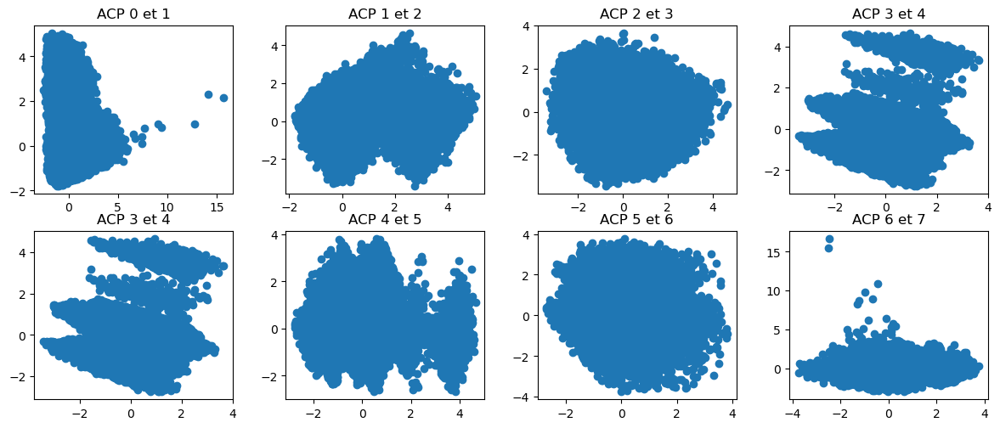

In [32]:
row=2
row_2 = round(df.shape[1]/row)
f, ax = plt.subplots(nrows=row, ncols=round(df.shape[1]/row), figsize=(12,5))
f.tight_layout()
for i in np.arange(int(round(df.shape[1]/row))):
    ax[0,i].scatter(acp[:,i], acp[:,i+1])
    ax[0,i].title.set_text('ACP {} et {}'.format(i, i+1))
    ax[1,i].scatter(acp[:,[row_2+i-1]], acp[:,[row_2+i]])
    ax[1,i].title.set_text('ACP {} et {}'.format(row_2+i-1, row_2+i))
plt.savefig("acp_kmean.png", bbox_inches='tight', transparent=True)
plt.show()

In [33]:
round(df.shape[1]/row)

4

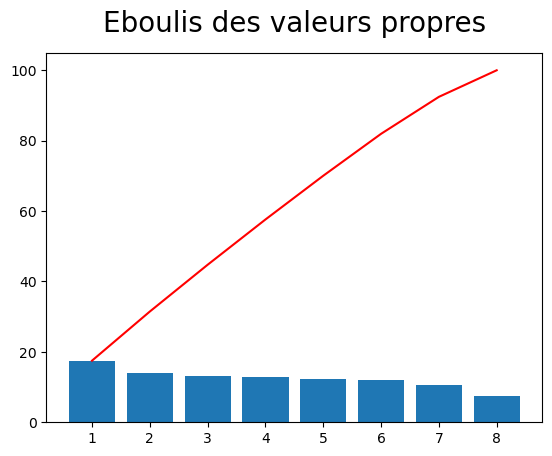

In [34]:
# Eboulis des valeurs propres

scree = pca.explained_variance_ratio_*100
plt.bar(np.arange(len(scree))+1, scree)
plt.plot(np.arange(len(scree))+1, scree.cumsum(), c='red')
plt.title("Eboulis des valeurs propres", fontsize=20, pad=15)
plt.savefig("eboulis.png", bbox_inches='tight', transparent=True)
plt.show()

In [35]:
pcs = pca.components_

In [36]:
n_comp = 8

In [37]:
# Calcul des composantes principales
cos = pd.DataFrame(np.round_(pcs,2), index=['F'+str(i+1) for i in range(pca.n_components_)], columns=dfx.columns)
cos = abs(cos)
cos = cos.transpose()
cos

,F1,F2,F3,F4,F5,F6,F7,F8
date_last_purchase,0.20,0.05,0.17,0.65,0.27,0.63,0.04,0.17
delivery_time,0.70,0.08,0.02,0.02,0.00,0.02,0.07,0.70
total_purchase_amount,0.02,0.55,0.57,0.01,0.10,0.22,0.55,0.12
mean_review_score,0.44,0.06,0.40,0.39,0.10,0.52,0.08,0.45
total_purchase_count,0.12,0.72,0.12,0.16,0.16,0.03,0.62,0.11
item_most_purchase,0.04,0.39,0.60,0.20,0.18,0.46,0.45,0.03
customer_state,0.50,0.10,0.25,0.51,0.15,0.26,0.30,0.49
payment_type,0.09,0.08,0.22,0.30,0.91,0.09,0.09,0.09


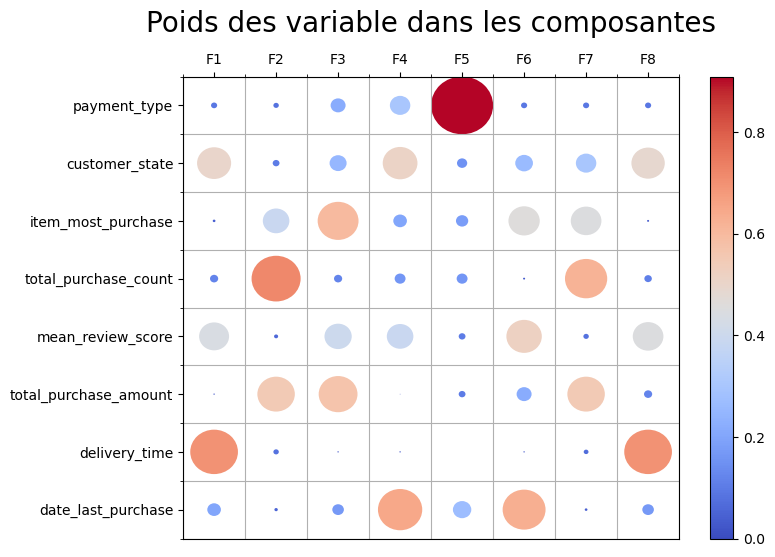

In [38]:
from matplotlib.collections import PatchCollection

N = len(cos.index)
M = len(cos.columns)
ylabels = cos.index
xlabels = cos.columns

x, y = np.meshgrid(np.arange(M), np.arange(N))
s = cos.values  #np.random.randint(0, 180, size=(N,M))
c = cos.values   #np.random.rand(N, M)-0.5

fig, ax = plt.subplots(figsize=(8,6))

R = s/s.max()/2
circles = [plt.Circle((j,i), radius=r) for r, j, i in zip(R.flat, x.flat, y.flat)]
col = PatchCollection(circles, array=c.flatten(), cmap="coolwarm")
ax.add_collection(col)

ax.set(xticks=np.arange(M), yticks=np.arange(N),
       xticklabels=xlabels, yticklabels=ylabels)
ax.set_xticks(np.arange(M+1)-0.5, minor=True)
ax.set_yticks(np.arange(N+1)-0.5, minor=True)
ax.grid(which='minor')
ax.xaxis.tick_top()
plt.title("Poids des variable dans les composantes", fontsize=20, pad=15)
plt.savefig("graph_poid_variables.png", bbox_inches='tight', transparent=True)
fig.colorbar(col)
plt.show()

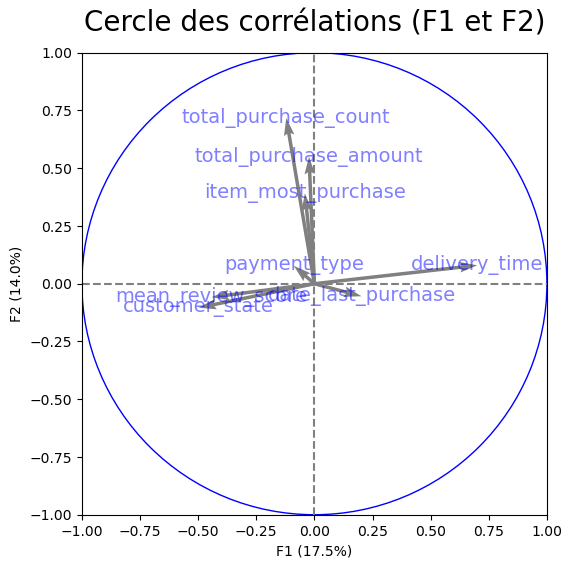

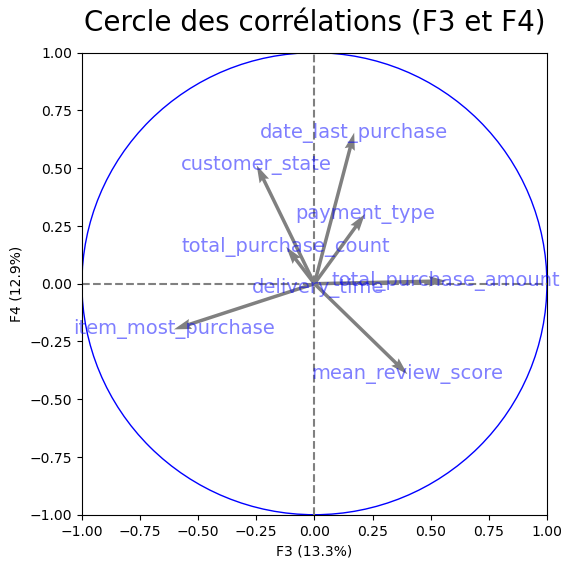

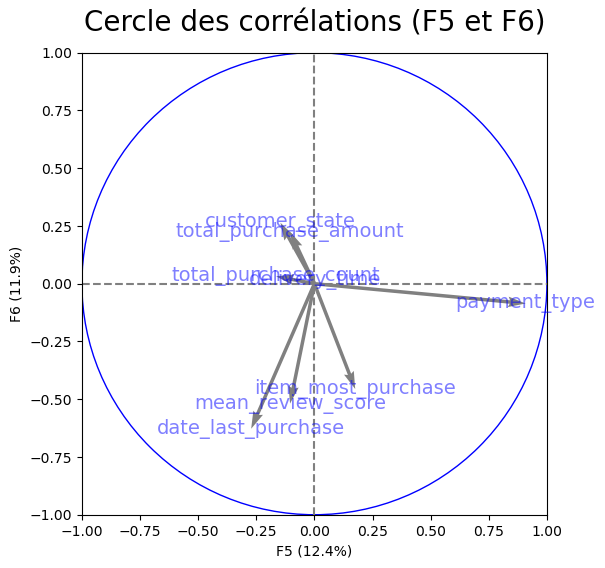

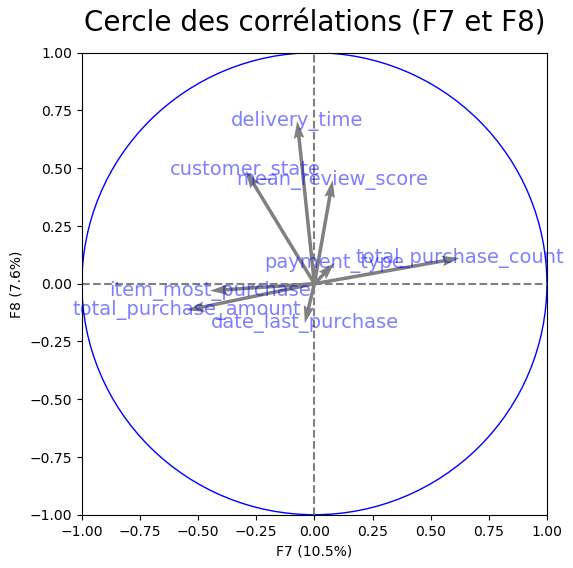

In [39]:
# Representation graphique des composantes

axis_ranks = [(0,1),(2,3),(4,5),(6,7), (8,9)]
xmin, xmax, ymin, ymax = -1,1,-1,1
labels = np.array(dfx.columns)
label_rotation = 0
for d1, d2 in axis_ranks:
    if d2 < n_comp :
        fig, ax = plt.subplots(figsize=(6,6))
        plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]), pcs[d1,:], pcs[d2,:], angles='xy', scale_units='xy', scale=1, color='grey')
        if labels is not None:
            for i, (x, y) in enumerate(pcs[[d1,d2]].T):
                if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                    plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color='blue', alpha=0.5)
        circle = plt.Circle((0,0),1, facecolor='none', edgecolor='b')
        plt.gca().add_artist(circle)
        plt.xlim(xmin, xmax)
        plt.ylim(ymin, ymax)
        plt.plot([-1,1], [0,0], color='grey', ls='--')
        plt.plot([0,0], [-1,1], color='grey', ls='--')
        plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
        plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))
        plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1), fontsize=20, pad=15)
        plt.savefig("cercle_des_correlations"+str(d1+1)+".png", bbox_inches='tight', transparent=True)
        plt.show(block=False)

In [40]:
data = pd.DataFrame(acp[:,:n_comp], index=df.index, columns=['F'+str(i+1) for i in range(n_comp)])

In [41]:
data.head()

,F1,F2,F3,F4,F5,F6,F7,F8
customer_unique_id,,,,,,,,
0000f46a3911fa3c0805444483337064,1.034531,0.223175,-1.613635,-0.556735,0.990378,1.212462,-0.734122,1.345413
0000f6ccb0745a6a4b88665a16c9f078,1.356908,0.028372,-1.076044,-0.216830,0.615153,-1.358966,-0.196249,0.217793
0004aac84e0df4da2b147fca70cf8255,-0.504782,0.708834,-0.079986,0.593739,-0.013546,-1.175945,-1.581750,0.518509
0005e1862207bf6ccc02e4228effd9a0,-0.929573,-0.014949,0.023114,-1.005736,0.721740,1.294101,-0.132202,-0.630387
0006fdc98a402fceb4eb0ee528f6a8d4,1.717002,-0.902984,0.089506,-0.400985,0.642920,0.552572,1.291980,-0.713777


##### [sommaire](#S)

## A, KMeans <a class='anchor' id='IIA'></a>

In [42]:
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

In [43]:
from sklearn import cluster, metrics

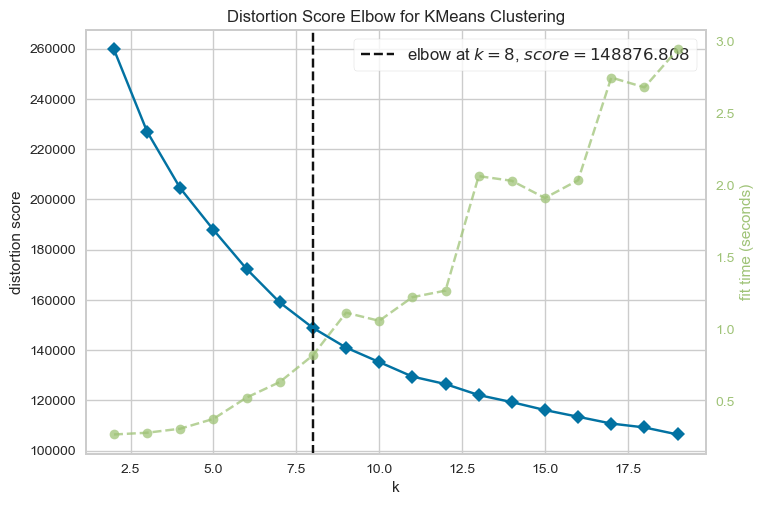

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [58]:
# Instantiate the clustering model and visualizer
model = cluster.KMeans()
visualizer1 = KElbowVisualizer(model, k=(2,20))

visualizer1.fit(data.values)    # Fit the data to the visualizer
plt.savefig("acp_kmean_dist_elbow.png", bbox_inches='tight', transparent=True)
visualizer1.show()    # Draw/show/poof the data

nombre de cluster :  2


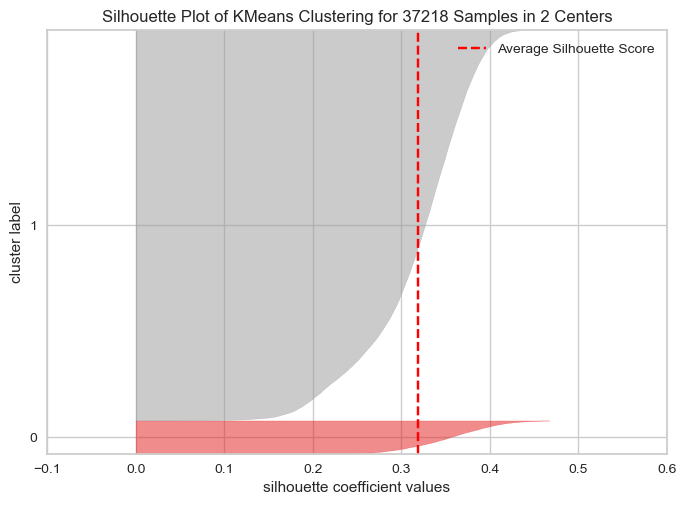

-------------------------------------------------------------------------------------
nombre de cluster :  3


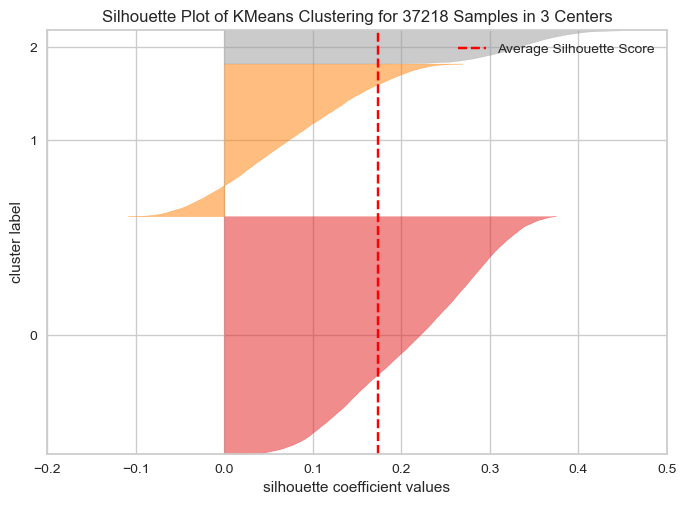

-------------------------------------------------------------------------------------
nombre de cluster :  4


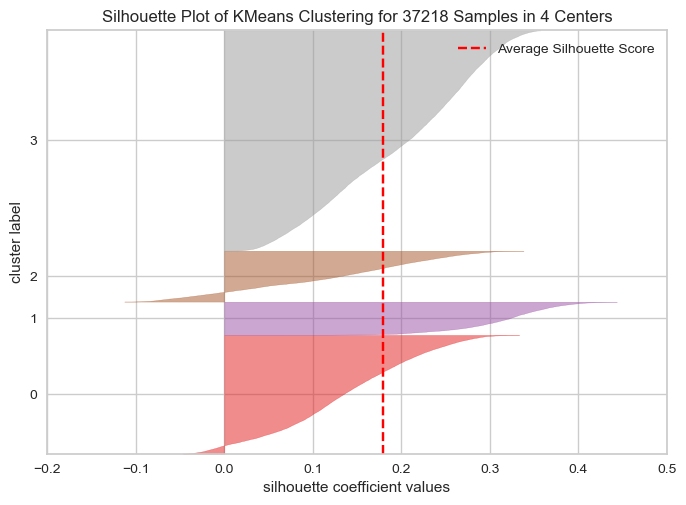

-------------------------------------------------------------------------------------
nombre de cluster :  5


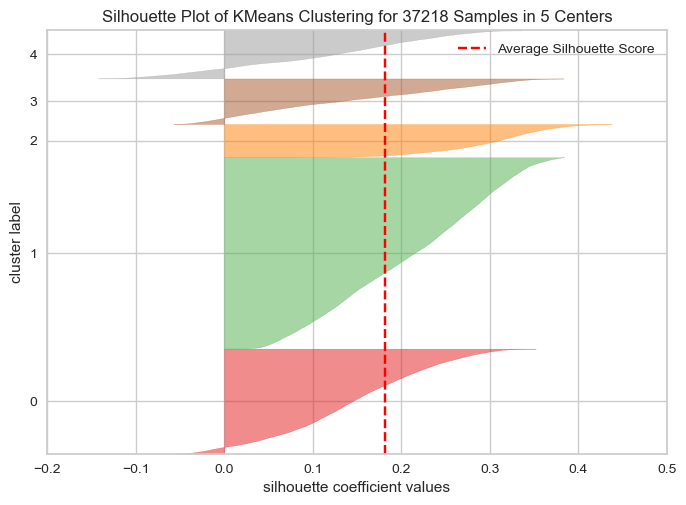

-------------------------------------------------------------------------------------
nombre de cluster :  6


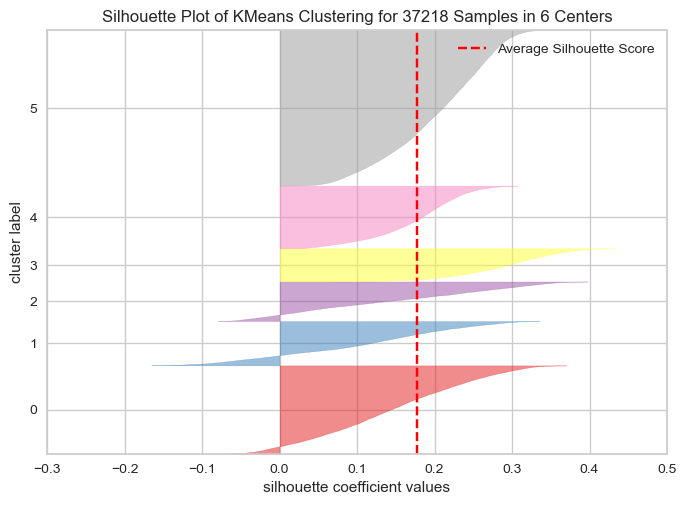

-------------------------------------------------------------------------------------
nombre de cluster :  7


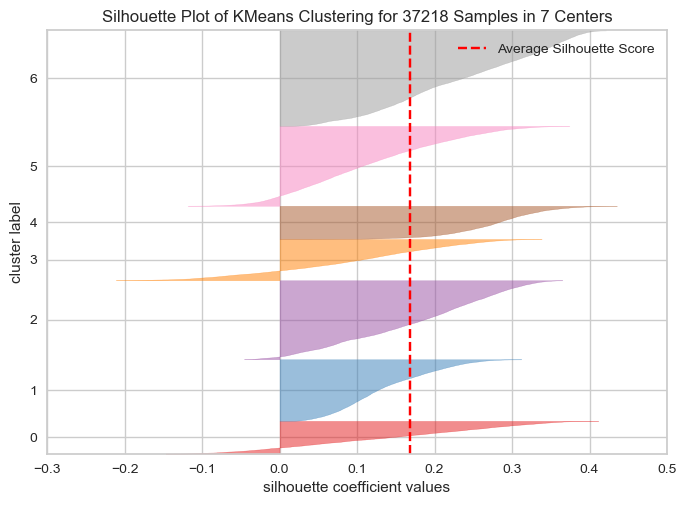

-------------------------------------------------------------------------------------
nombre de cluster :  8


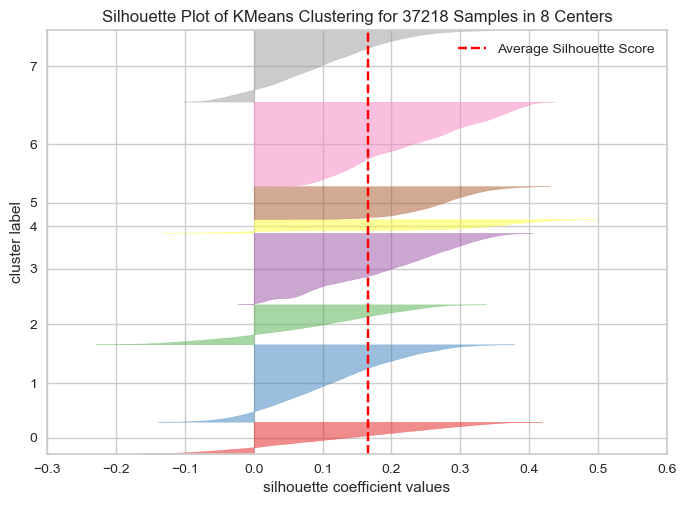

-------------------------------------------------------------------------------------
nombre de cluster :  9


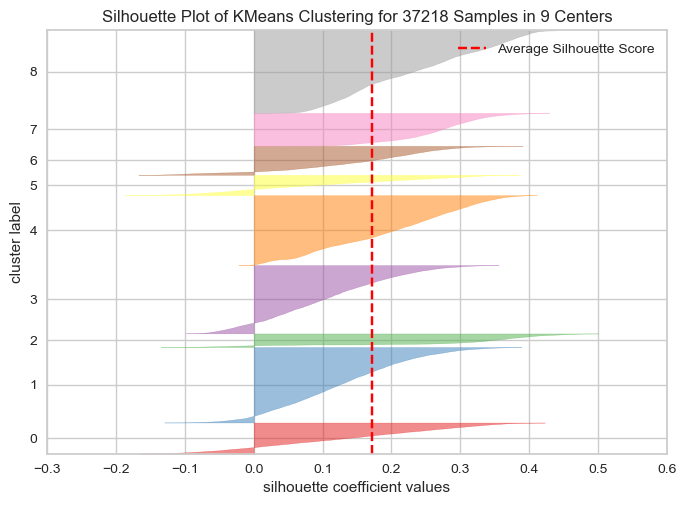

-------------------------------------------------------------------------------------


In [47]:
# Instantiate the clustering model and visualizer 
for i in range(2, 10): 
    print("nombre de cluster : ", i)
    model = cluster.KMeans(i)
    visualizer2 = SilhouetteVisualizer(model)

    visualizer2.fit(acp)    # Fit the data to the visualizer
    plt.savefig("acp_kmean_sihouette_kmean_"+str(i)+".png", bbox_inches='tight', transparent=True)
    visualizer2.show()
    print('-------------------------------------------------------------------------------------')

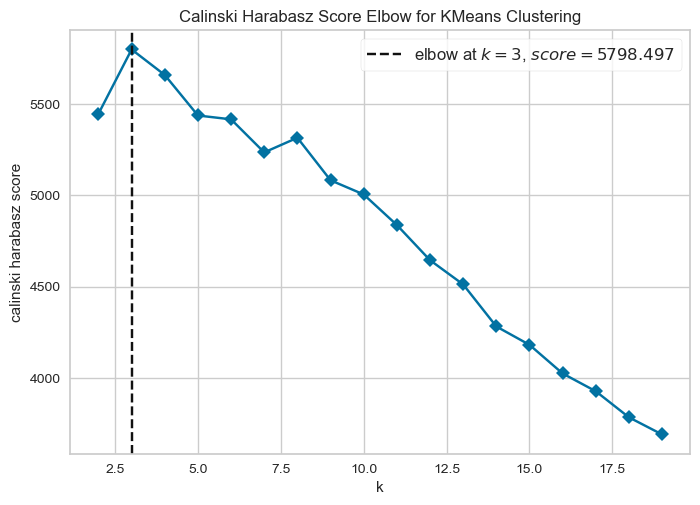

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [48]:
# Instantiate the clustering model and visualizer 
model = cluster.KMeans()
visualizer3 = KElbowVisualizer(model, k=(2,20), metric='calinski_harabasz', timings=False)

visualizer3.fit(data.values)    # Fit the data to the visualizer
plt.savefig("acp_kmean_calinski_harabasz.png", bbox_inches='tight', transparent=True)
visualizer3.poof() 

cluster 2


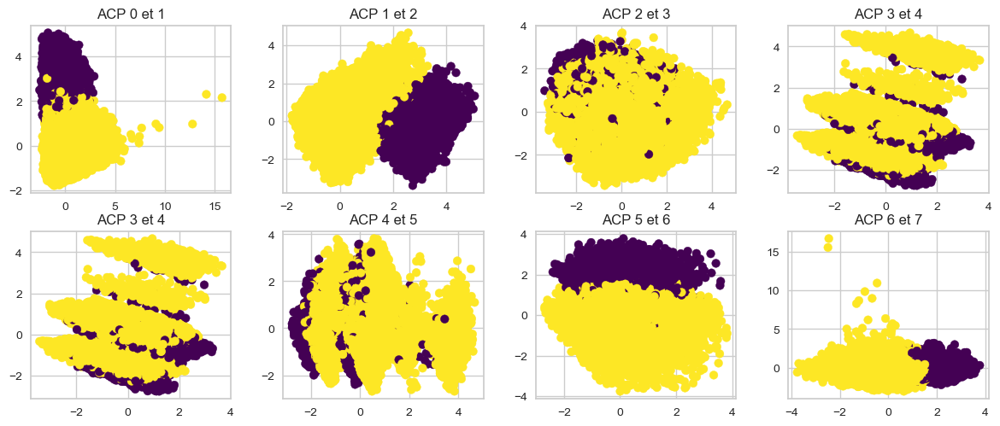

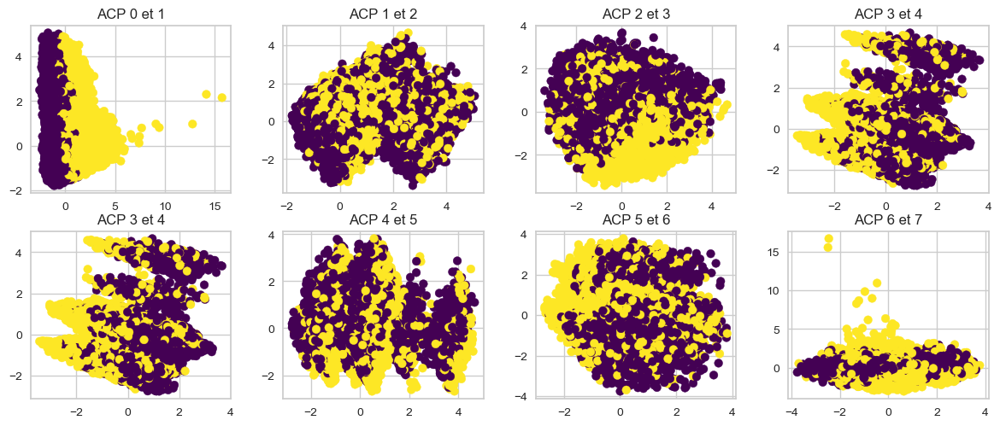

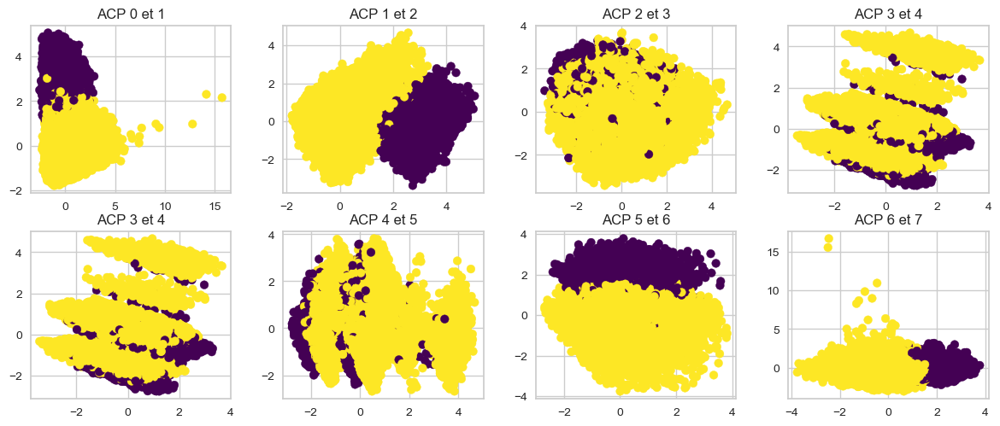

---------------------------------------------------------------------------------------------------
cluster 3


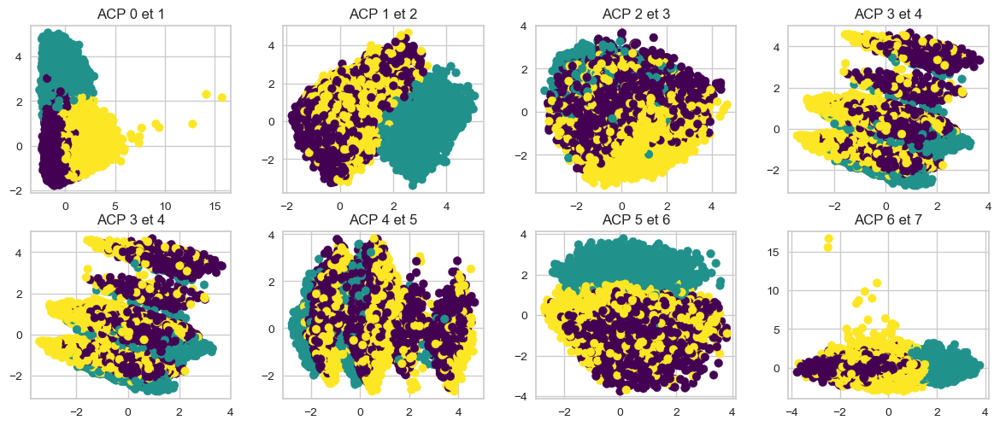

---------------------------------------------------------------------------------------------------
cluster 4


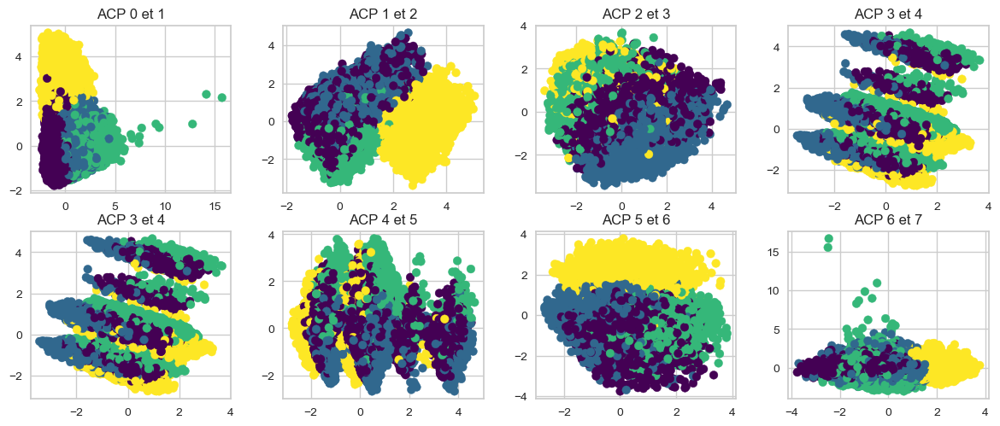

---------------------------------------------------------------------------------------------------
cluster 5


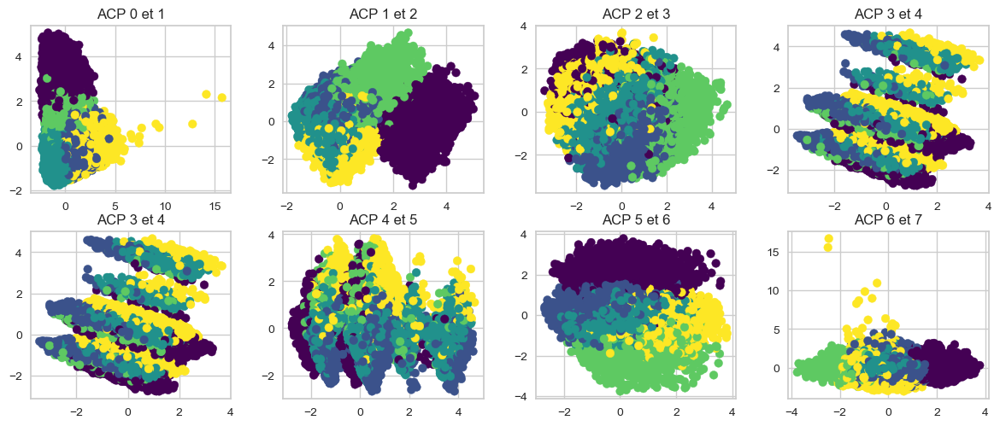

---------------------------------------------------------------------------------------------------
cluster 6


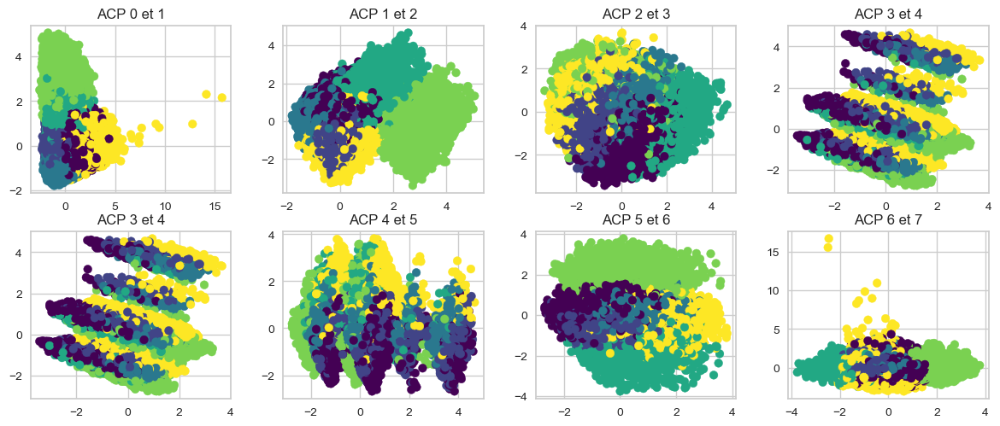

---------------------------------------------------------------------------------------------------
cluster 7


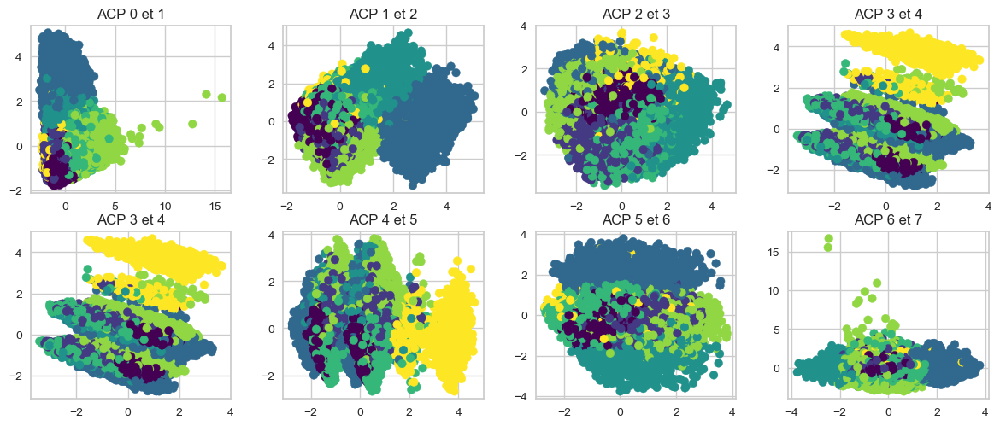

---------------------------------------------------------------------------------------------------
cluster 8


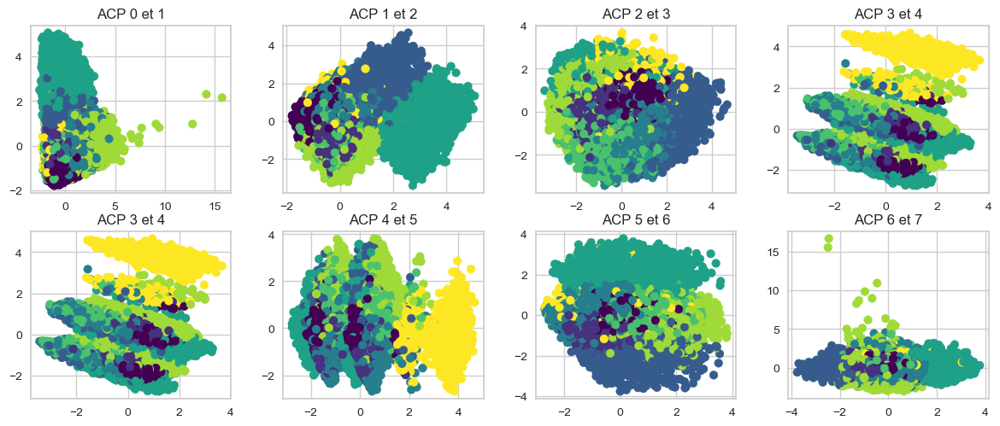

---------------------------------------------------------------------------------------------------
cluster 9


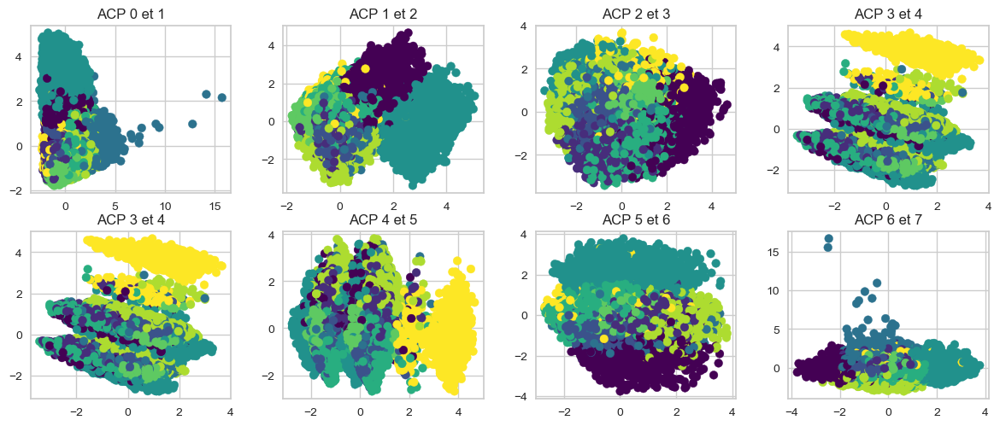

---------------------------------------------------------------------------------------------------


In [51]:
row = 2
row_2 = round(data.shape[1]/row)

for k in range(2,10):
    km = cluster.KMeans(n_clusters=k)
    km.fit(data.values)
    print('cluster', k)
    f, ax = plt.subplots(nrows=row, ncols=round(data.shape[1]/row), figsize=(12,5))
    f.tight_layout()
    for i in np.arange(int(round(data.shape[1]/row))):
        ax[0,i].scatter(acp[:,i], acp[:,i+1], c=km.labels_, cmap='viridis')
        ax[0,i].title.set_text('ACP {} et {}'.format(i, i+1))
        ax[1,i].scatter(acp[:,[row_2+i-1]], acp[:,[row_2+i]], c=km.labels_, cmap='viridis')
        ax[1,i].title.set_text('ACP {} et {}'.format(row_2+i-1, row_2+i))
    plt.savefig("acp_kmean_k_"+str(k)+".png", bbox_inches='tight', transparent=True)
    plt.show()
    print('---------------------------------------------------------------------------------------------------')

##### [sommaire](#S)

## B, DBSCAN <a class='anchor' id='IIB'></a>

In [52]:
from sklearn.cluster import DBSCAN

In [75]:
first = []
second = []
groupe = []
max_g = []
min_g = []

eps = [0.5, 1, 2]
min_sample = [10, 50, 100]

for i in eps:
    for j in min_sample:
        dbs = DBSCAN(eps=i, min_samples=j).fit_predict(data.values)
        unique, counts = np.unique(dbs, return_counts=True)
        first.append(i)
        second.append(j)
        groupe.append(len(unique))
        max_g.append(max(counts))
        min_g.append(min(counts))
scan = pd.DataFrame([first, second, groupe, max_g, min_g], index=['first', 'second', 'group', 'max_g', 'min_g']).T

In [74]:
scan

,first,second,group,max_g,min_g
0,0.5,50.0,6.0,31327.0,154.0
1,0.5,500.0,1.0,37218.0,37218.0
2,0.5,5000.0,1.0,37218.0,37218.0
3,1.0,50.0,7.0,21872.0,52.0
4,1.0,500.0,2.0,26865.0,10353.0
5,1.0,5000.0,1.0,37218.0,37218.0
6,2.0,50.0,3.0,34264.0,61.0
7,2.0,500.0,3.0,32730.0,2012.0
8,2.0,5000.0,2.0,25597.0,11621.0


In [62]:
dbs = DBSCAN(eps=0.5, min_samples=100).fit(data.values)

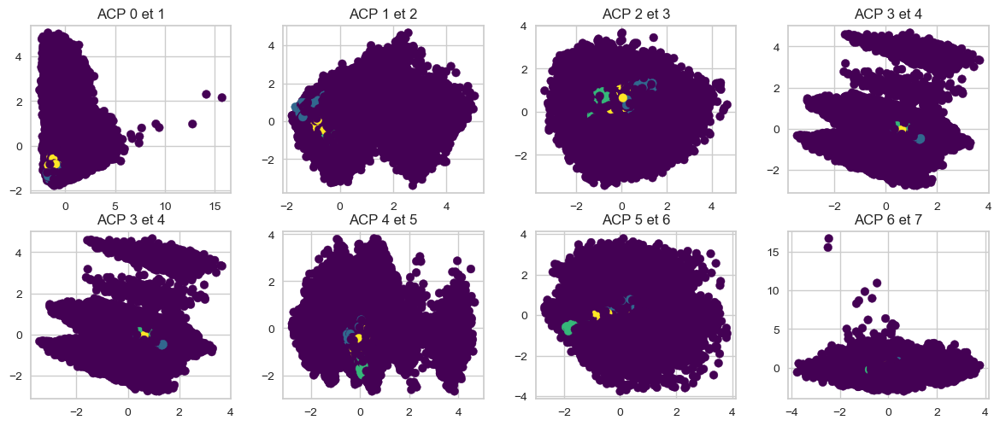

In [63]:
row=2
col = round(data.shape[1]/row)
f, ax = plt.subplots(nrows=row, ncols=col, figsize=(12,5))
f.tight_layout()
for i in np.arange(int(col)):
    ax[0,i].scatter(acp[:,i], acp[:,i+1], c=dbs.labels_, cmap='viridis')
    ax[0,i].title.set_text('ACP {} et {}'.format(i, i+1))
    ax[1,i].scatter(acp[:,[col+i-1]], acp[:,[col+i]], c=dbs.labels_, cmap='viridis')
    ax[1,i].title.set_text('ACP {} et {}'.format(col+i-1, col+i))
plt.savefig("acp_dbscan_1.png", bbox_inches='tight', transparent=True)
plt.show()

In [64]:
dbs = DBSCAN(eps=1, min_samples=50).fit(data.values)

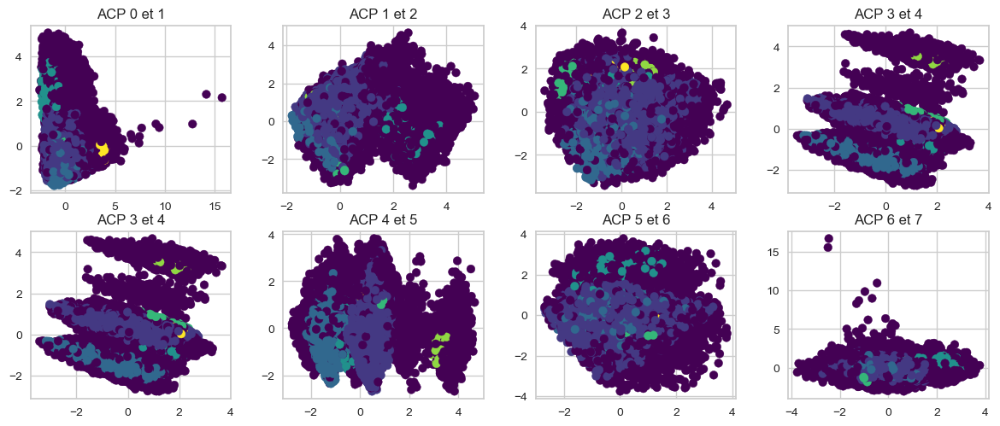

In [65]:
row=2
col = round(data.shape[1]/row)
f, ax = plt.subplots(nrows=row, ncols=col, figsize=(12,5))
f.tight_layout()
for i in np.arange(int(col)):
    ax[0,i].scatter(acp[:,i], acp[:,i+1], c=dbs.labels_, cmap='viridis')
    ax[0,i].title.set_text('ACP {} et {}'.format(i, i+1))
    ax[1,i].scatter(acp[:,[col+i-1]], acp[:,[col+i]], c=dbs.labels_, cmap='viridis')
    ax[1,i].title.set_text('ACP {} et {}'.format(col+i-1, col+i))
plt.savefig("acp_dbscan_2.png", bbox_inches='tight', transparent=True)
plt.show()

In [66]:
dbs = DBSCAN(eps=2, min_samples=100).fit(data.values)

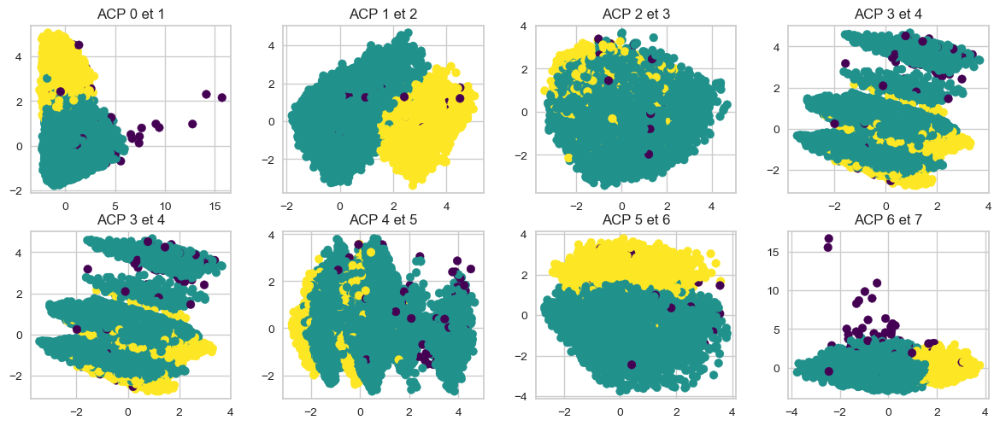

In [68]:
row=2
col = round(data.shape[1]/row)
f, ax = plt.subplots(nrows=row, ncols=col, figsize=(12,5))
f.tight_layout()
for i in np.arange(int(col)):
    ax[0,i].scatter(acp[:,i], acp[:,i+1], c=dbs.labels_, cmap='viridis')
    ax[0,i].title.set_text('ACP {} et {}'.format(i, i+1))
    ax[1,i].scatter(acp[:,[col+i-1]], acp[:,[col+i]], c=dbs.labels_, cmap='viridis')
    ax[1,i].title.set_text('ACP {} et {}'.format(col+i-1, col+i))
plt.savefig("acp_dbscan_3.png", bbox_inches='tight', transparent=True)
plt.show()

##### [sommaire](#S)

# III, TSNE <a class='anchor' id='III'></a>

In [311]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
X_embedded = tsne.fit_transform(X_scaled)
tsn = pd.DataFrame(X_embedded)

In [312]:
tsn.head(2)

,0,1
0,-42.419632,29.158924
1,-29.051970,20.730495


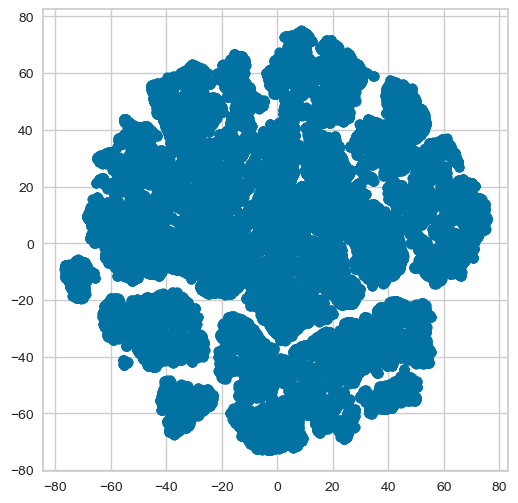

In [313]:
plt.figure(figsize=(6,6))
plt.scatter(tsn.loc[:,0], tsn.loc[:,1])
plt.savefig("tsne.png", bbox_inches='tight', transparent=True)
plt.show()

## A, KMeans <a class='anchor' id='IIIA'></a>

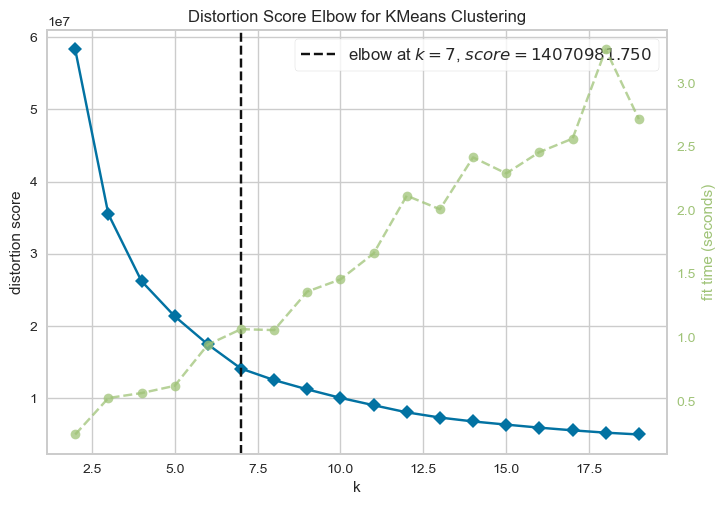

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [314]:
# Instantiate the clustering model and visualizer
model = cluster.KMeans()
visualizer1 = KElbowVisualizer(model, k=(2,20))

visualizer1.fit(tsn.values)    # Fit the data to the visualizer
plt.savefig("tsne_kmean_elbow.png", bbox_inches='tight', transparent=True)
visualizer1.show()    # Draw/show/poof the data

nombre de cluster :  2


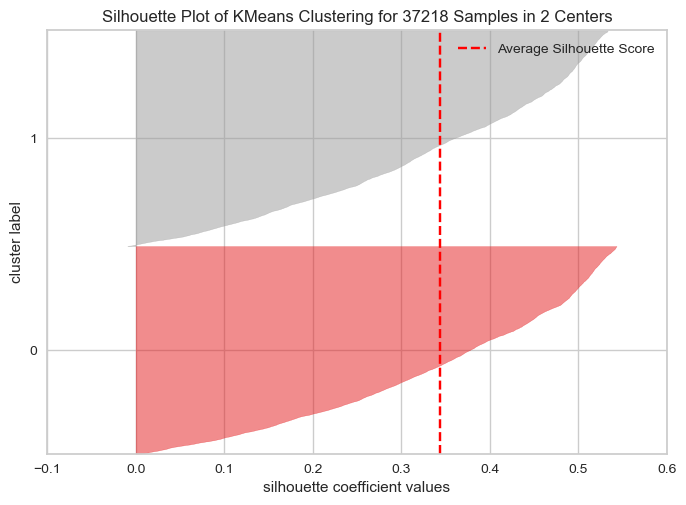

-------------------------------------------------------------------------------------
nombre de cluster :  3


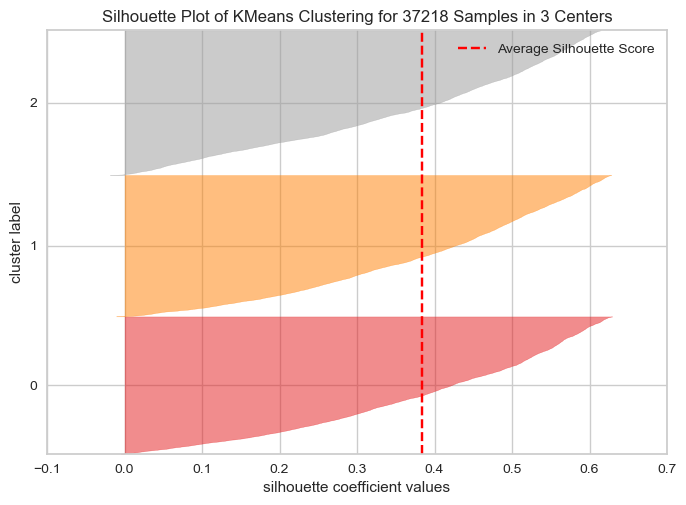

-------------------------------------------------------------------------------------
nombre de cluster :  4


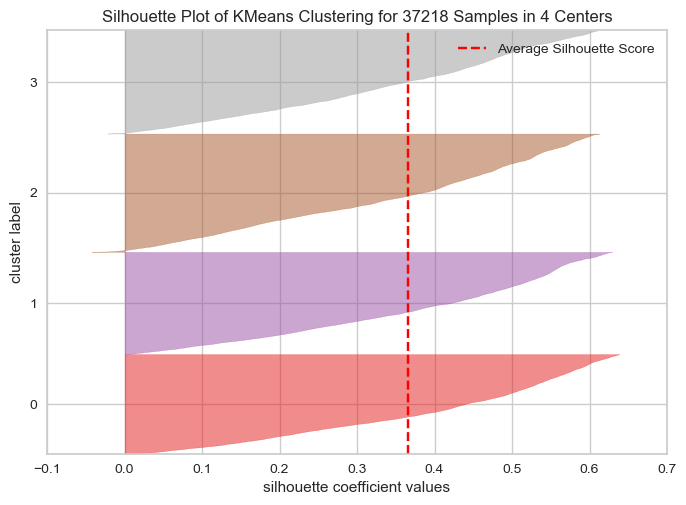

-------------------------------------------------------------------------------------
nombre de cluster :  5


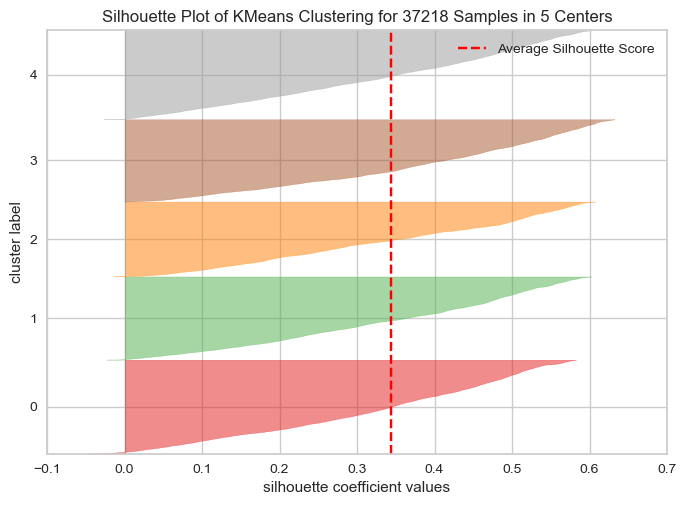

-------------------------------------------------------------------------------------
nombre de cluster :  6


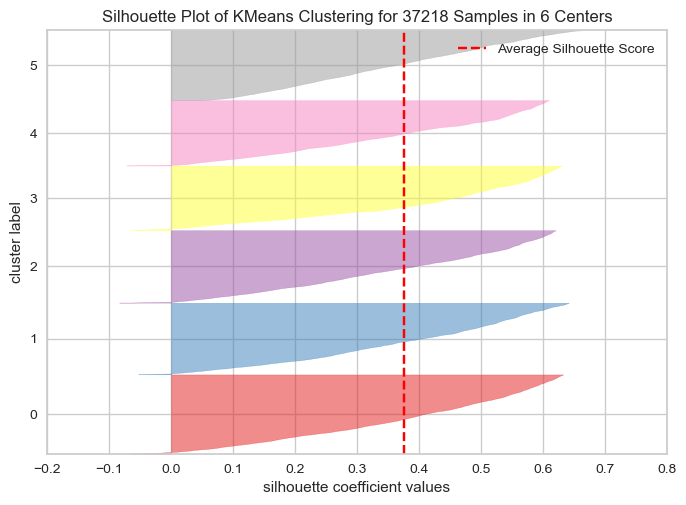

-------------------------------------------------------------------------------------
nombre de cluster :  7


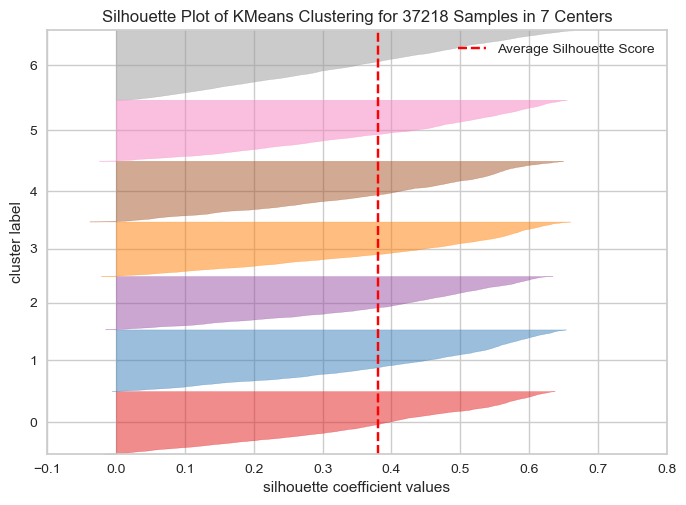

-------------------------------------------------------------------------------------
nombre de cluster :  8


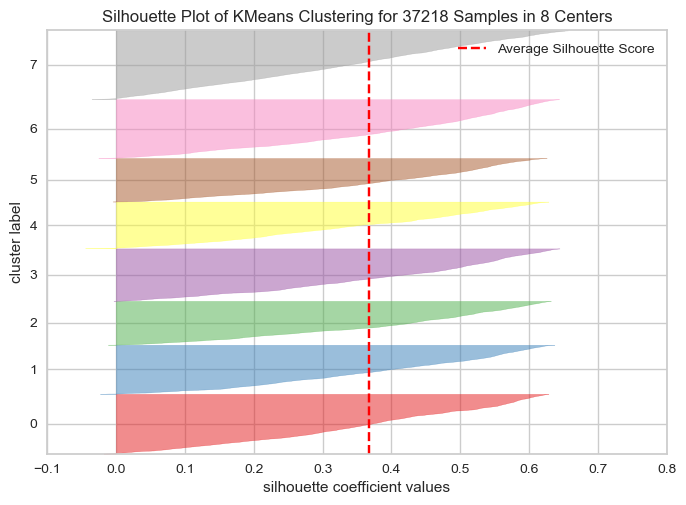

-------------------------------------------------------------------------------------
nombre de cluster :  9


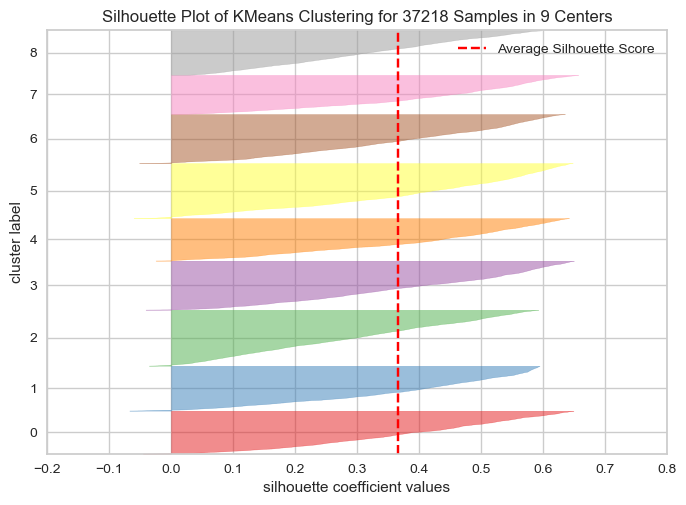

-------------------------------------------------------------------------------------


In [315]:
# Instantiate the clustering model and visualizer 
for i in range(2, 10): 
    print("nombre de cluster : ", i)
    model = cluster.KMeans(i)
    visualizer2 = SilhouetteVisualizer(model)

    visualizer2.fit(tsn.values)    # Fit the data to the visualizer
    plt.savefig("tsne_kmean_sihouette"+str(i)+".png", bbox_inches='tight', transparent=True)
    visualizer2.show()
    print('-------------------------------------------------------------------------------------')

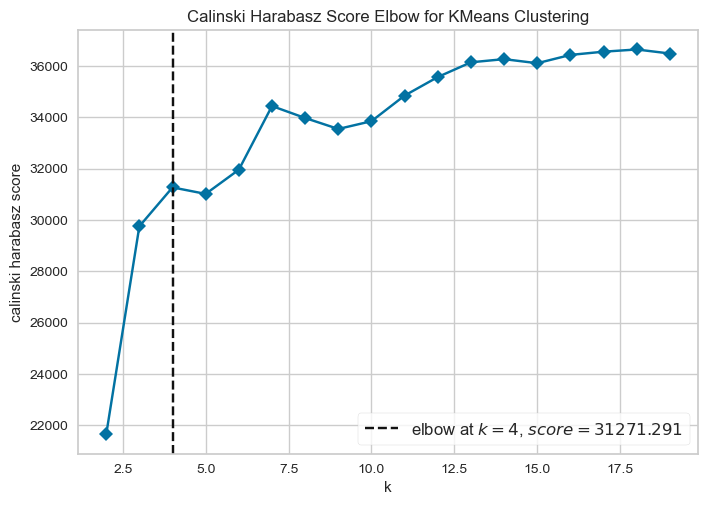

<AxesSubplot:title={'center':'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [316]:
# Instantiate the clustering model and visualizer 
model = cluster.KMeans()
visualizer3 = KElbowVisualizer(model, k=(2,20), metric='calinski_harabasz', timings=False)

visualizer3.fit(tsn.values)    # Fit the data to the visualizer
plt.savefig("tsne_kmean_calinski_harabasz.png", bbox_inches='tight', transparent=True)
visualizer3.poof() 

cluster 2


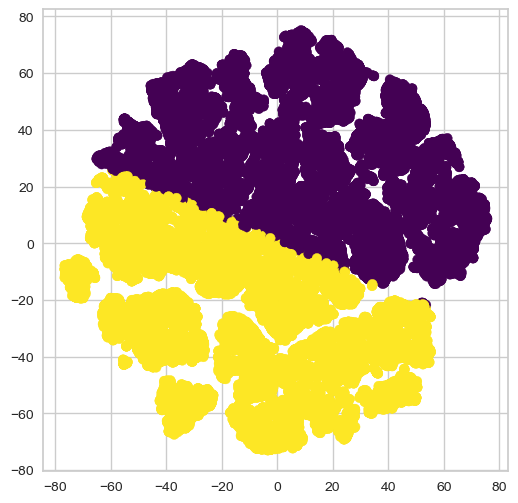

cluster 3


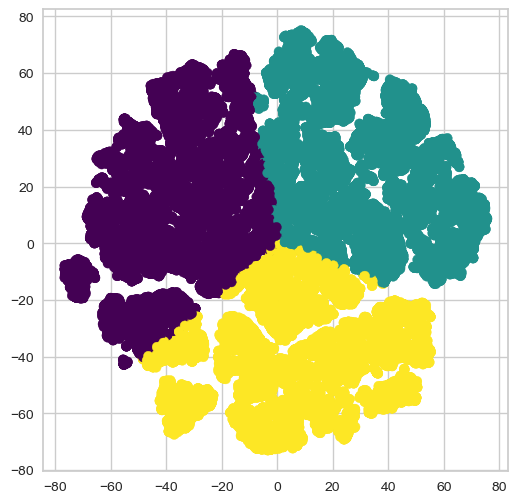

cluster 4


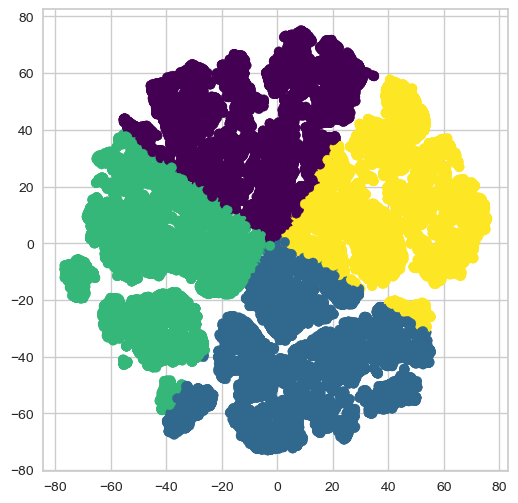

cluster 5


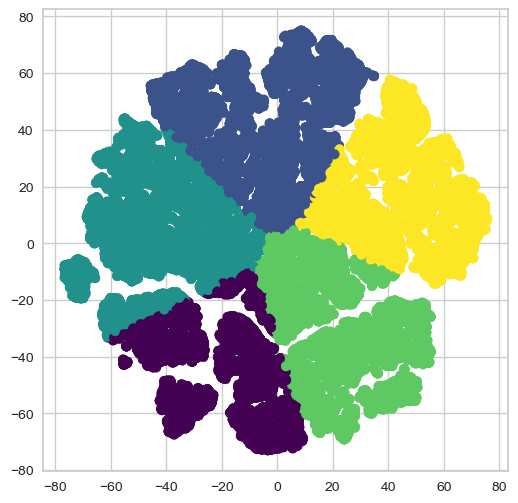

cluster 6


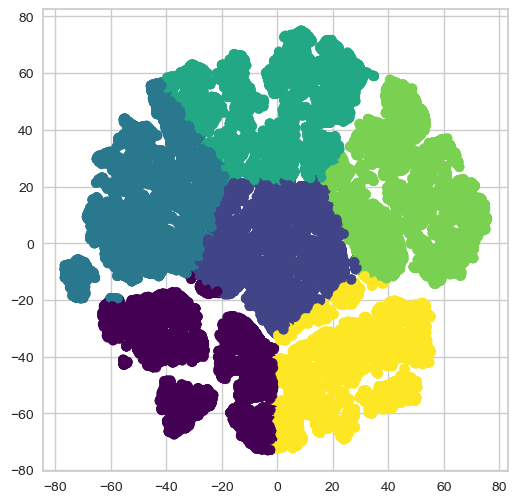

cluster 7


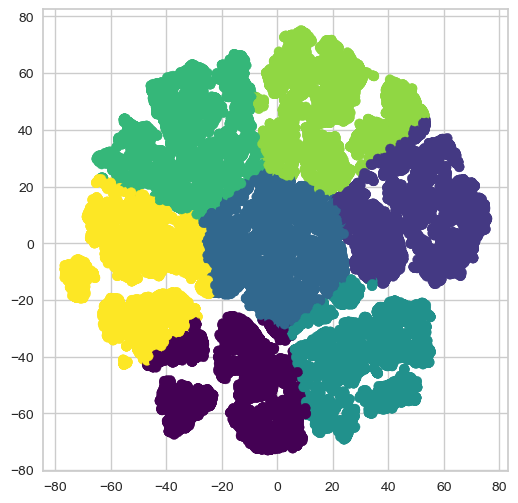

cluster 8


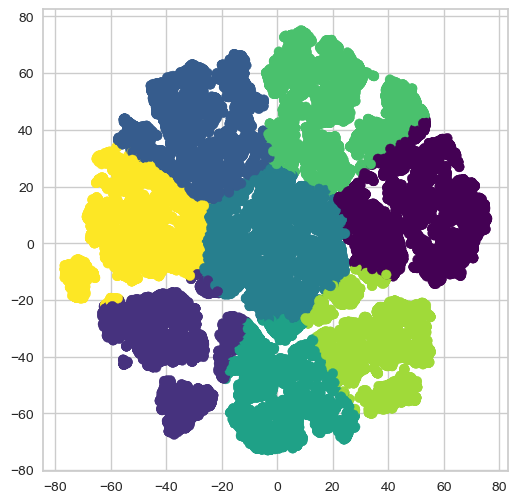

cluster 9


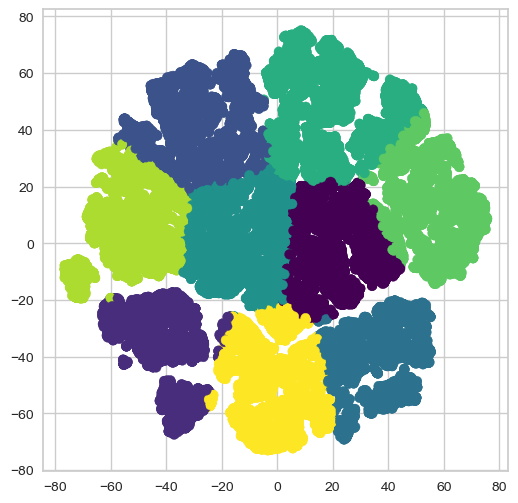

cluster 10


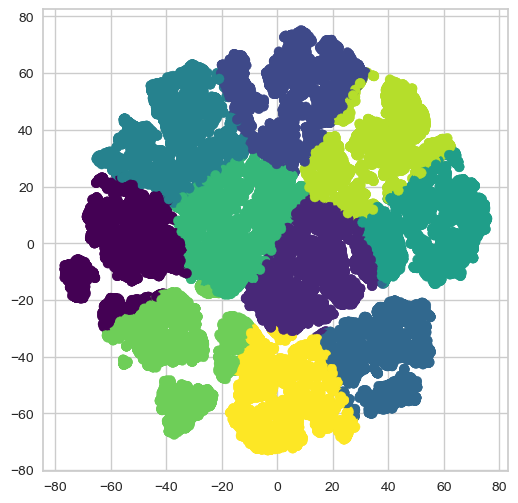

cluster 11


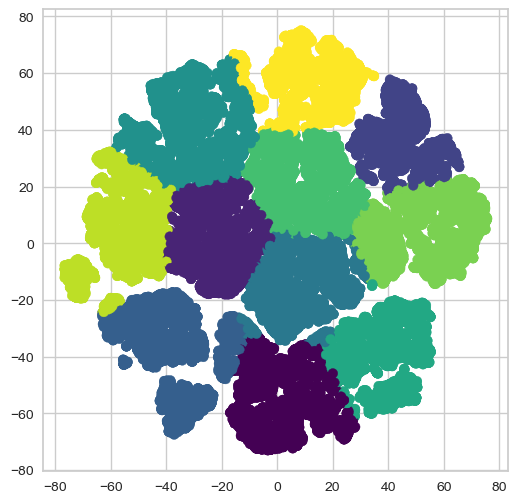

cluster 12


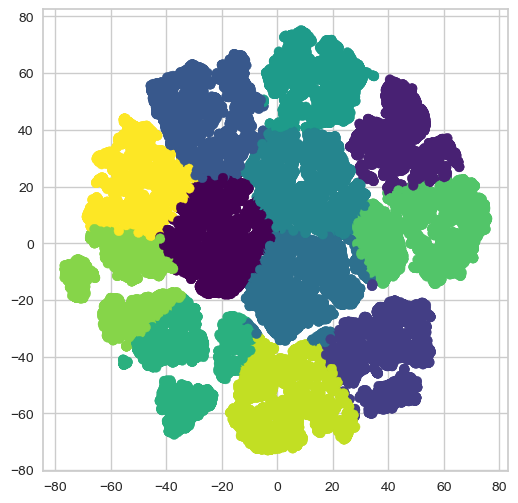

cluster 13


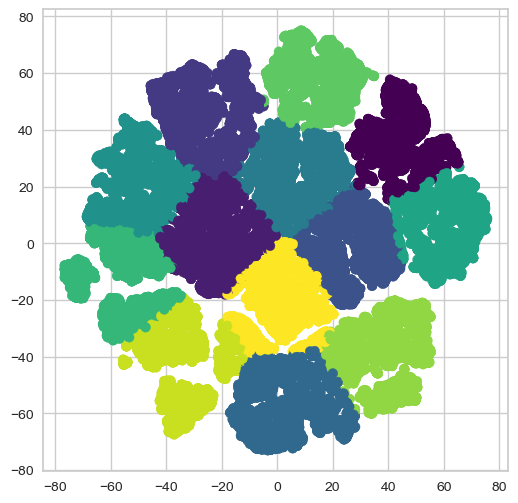

cluster 14


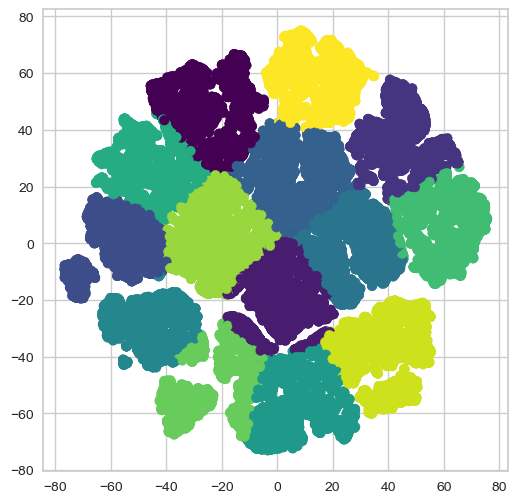

In [383]:
row = 2
for i in range(2,15):
    plt.figure(figsize=(6,6))
    km = cluster.KMeans(n_clusters=i)
    km.fit(tsn.values)
    print('cluster', i)
    plt.scatter(tsn[0], tsn[1], c=km.labels_, cmap='viridis')
    plt.savefig("tsne_kmean_k_"+str(i)+".png", bbox_inches='tight', transparent=True)
    plt.show()

##### [sommaire](#S)

## B, DBSCAN <a class='anchor' id='IIIB'></a>

In [318]:
first = []
second = []
groupe = []
max_g = []
min_g = []

eps = [1, 2, 5]
min_sample = [10, 20, 50, 100, 200, 500]

for i in eps:
    for j in min_sample:
        dbs = DBSCAN(eps=i, min_samples=j).fit_predict(tsn.values)
        unique, counts = np.unique(dbs, return_counts=True)
        first.append(i)
        second.append(j)
        groupe.append(len(unique))
        max_g.append(max(counts))
        min_g.append(min(counts))
scan = pd.DataFrame([first, second, groupe, max_g, min_g], index=['first', 'second', 'group', 'max_g', 'min_g']).T

In [319]:
scan

,first,second,group,max_g,min_g
0,1,10,423,1582,4
1,1,20,607,15178,13
2,1,50,1,37218,37218
3,1,100,1,37218,37218
4,1,200,1,37218,37218
5,1,500,1,37218,37218
6,2,10,12,21303,20
7,2,20,13,21244,20
8,2,50,193,8961,22
9,2,100,1,37218,37218


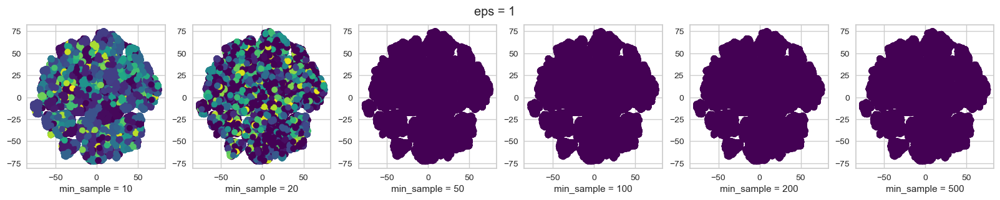

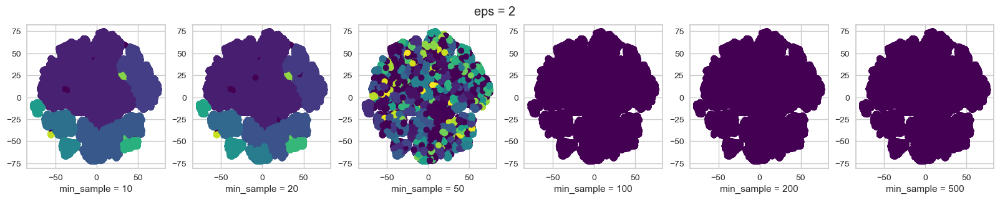

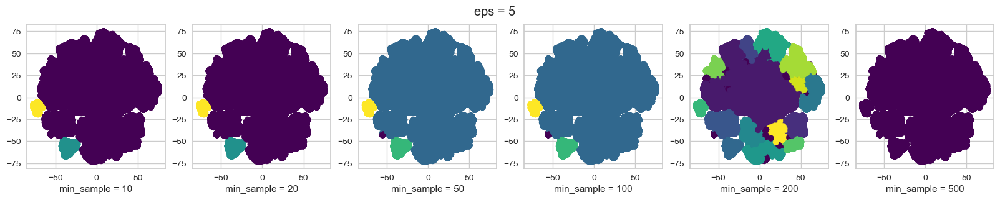

In [320]:
for i in eps:
    f, ax = plt.subplots(nrows=1, ncols=len(min_sample), figsize=(20,3))
    plt.suptitle("eps = {}".format(i))
    for j,c in zip(min_sample, range(len(min_sample))):
        dbs = DBSCAN(eps=i, min_samples=j).fit_predict(tsn.values)
        ax[c].scatter(tsn.loc[:,0], tsn.loc[:,1], c=dbs, cmap='viridis')
        ax[c].set_xlabel('min_sample = {}'.format(j))
    plt.savefig("tsne_dbscan_"+str(i)+".png", bbox_inches='tight', transparent=True)
    plt.show()

Vu les résultats ci-dessus, nous choisissons le KMeans effectué sur la représentation TSNE

In [352]:
#tsn.to_csv('tsn_kmean.csv')

In [52]:
tsn = pd.read_csv('tsn_kmean.csv', index_col=0 )

In [53]:
tsn.rename(columns={'0' : 0, '1' : 1}, inplace=True)

In [39]:
from sklearn import cluster

##### [sommaire](#S)

# IV, Tests de stabilité <a class='anchor' id='IV'></a>

## A, Test de stabilité à l'initiative <a class='anchor' id='IVA'></a>

### Test graphique

In [355]:
groupe = 6

Itération :  1


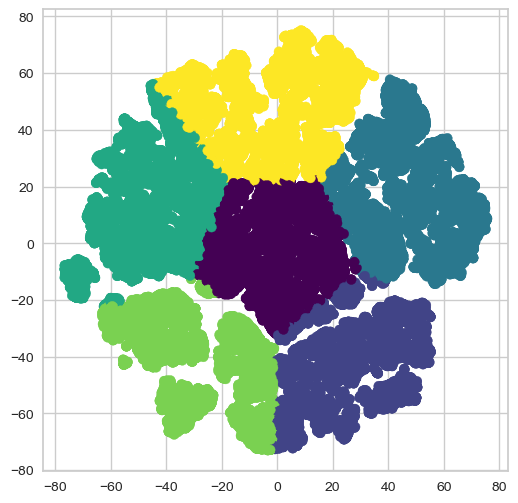

Itération :  2


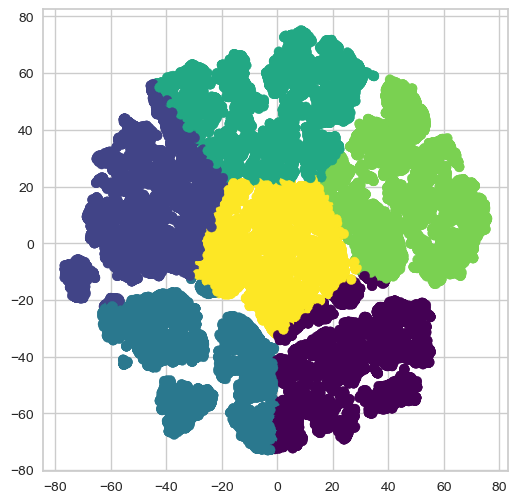

Itération :  3


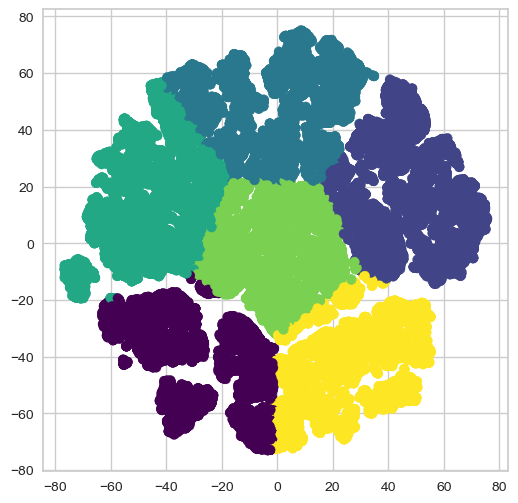

Itération :  4


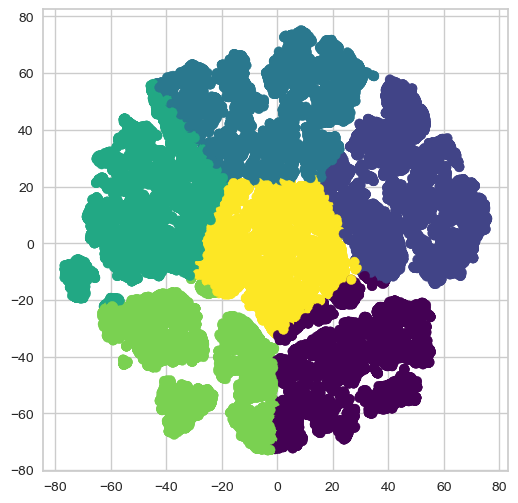

Itération :  5


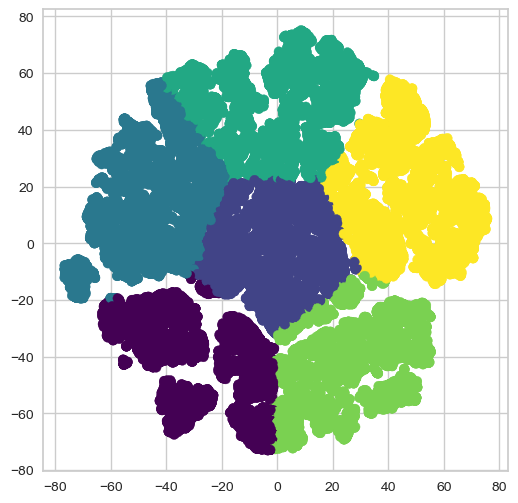

Itération :  6


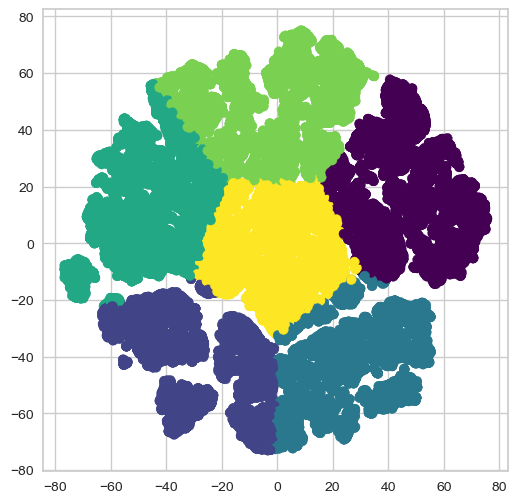

In [384]:
for i in range(6):
    plt.figure(figsize=(6,6))
    km = cluster.KMeans(n_clusters=groupe, init='random')
    km.fit(tsn.values)
    print('Itération : ', i+1)
    plt.scatter(tsn[0], tsn[1], c=km.labels_, cmap='viridis')
    plt.savefig("tsne_kmean_iteration_"+str(i)+".png", bbox_inches='tight', transparent=True)
    plt.show()

### Test numérique

In [56]:
liste = {}

In [57]:
for i in range(8):
    km = cluster.KMeans(n_clusters=groupe, init='random')
    km.fit(tsn.values)
    liste[i] = km.labels_

In [58]:
corr = pd.DataFrame(liste)

In [59]:
for k,a in zip(corr[0].unique(), ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i']):
    temp = corr.loc[corr[0] == k,1:]
    corr.loc[corr[0] == k,0] = a
    for c in temp.columns:
        max_serie = temp[c].value_counts()
        max_num = max_serie[max_serie == max(max_serie)].index[0]
        corr[c].replace(int(max_num), a, inplace=True)

In [60]:
for i,j in zip(corr[0].unique(), [i for i in range(groupe)]):
    corr.replace(i,j, inplace=True)

In [61]:
from sklearn.metrics import confusion_matrix

In [62]:
corr.head(2)

,0,1,2,3,4,5,6,7
0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0


In [63]:
for i in corr.columns:
    print(corr[i].unique())

[0 1 2 3 4 5 6]
[0 1 2 3 4 5 6]
[0 1 2 3 4 5 6]
[0 1 2 3 4 5 6]
[0 1 2 3 4 5 6]
[0 1 2 3 4 5 6]
[0 1 2 3 4 5 6]
[0 1 2 3 4 5 6]


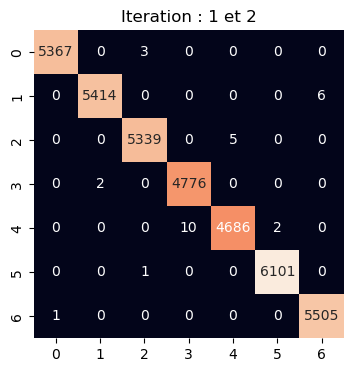

--------------------------------


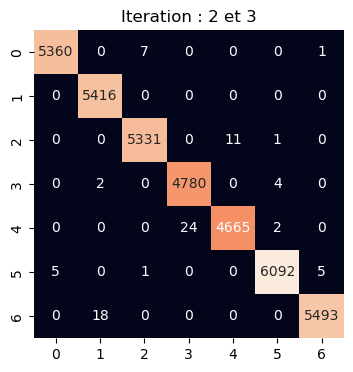

--------------------------------


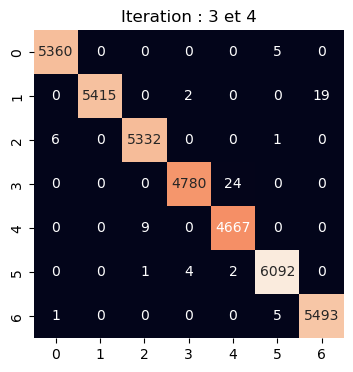

--------------------------------


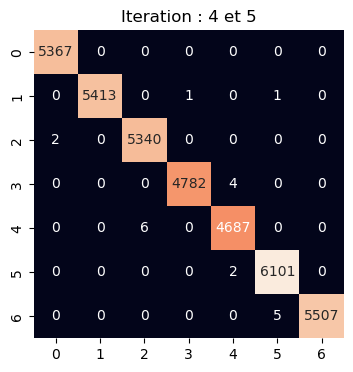

--------------------------------


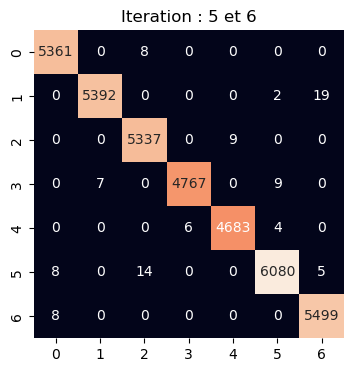

--------------------------------


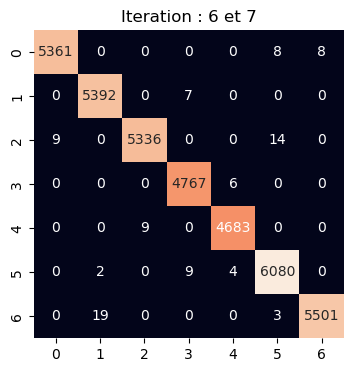

--------------------------------


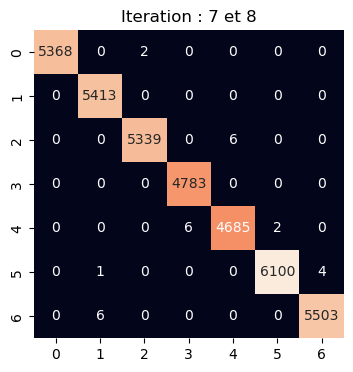

--------------------------------


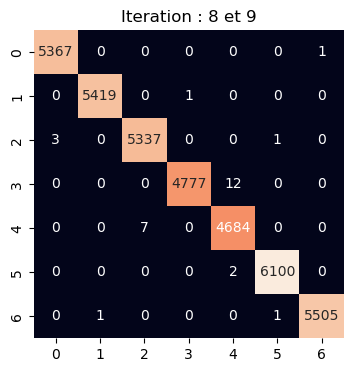

--------------------------------


In [64]:
for i in corr.columns-1:
    cf_matrix = confusion_matrix(corr.iloc[:,i], corr.iloc[:,i+1])
    plt.figure(figsize=(4,4))
    sns.heatmap(cf_matrix, annot=True, fmt='d',cbar=False)
    plt.title('Iteration : {} et {}'.format(i+2, i+3))
    plt.xlabel=[i for i in range(groupe)]
    plt.savefig("tsne_kmean_7_heatmap_"+str(i)+".png", bbox_inches='tight', transparent=True)
    plt.show()
    print('--------------------------------')

##### [sommaire](#S)

## B, Stabilité temporelle <a class='anchor' id='IVB'></a>

### Récupération des données temporelles complètes

In [65]:
data = pd.read_csv('data_regroupee.csv', index_col=0, parse_dates=[2,3])

In [66]:
data.head(2)

,price,order_purchase_timestamp,order_delivered_customer_date,product_category_name,review_score,customer_unique_id,customer_state,payment_type
0,58.9,2017-09-13 08:59:02,2017-09-20 23:43:48,cool_stuff,5,871766c5855e863f6eccc05f988b23cb,RJ,credit_card
1,239.9,2017-04-26 10:53:06,2017-05-12 16:04:24,pet_shop,4,eb28e67c4c0b83846050ddfb8a35d051,SP,credit_card


In [67]:
data.dtypes

price                                   float64
order_purchase_timestamp         datetime64[ns]
order_delivered_customer_date    datetime64[ns]
product_category_name                    object
review_score                              int64
customer_unique_id                       object
customer_state                           object
payment_type                             object
dtype: object

In [68]:
# transformation des données

def transformation(df):

    # composantes temporelles
    from datetime import timedelta
    snapshot_date = df.order_delivered_customer_date.max() + timedelta(days=1)

    duree = df.pivot_table(index='customer_unique_id', values='order_purchase_timestamp', aggfunc=['min', 'max'], dropna=False)
    duree['time_since_first_purchase_(days)'] = (snapshot_date - duree['min']['order_purchase_timestamp']).dt.days
    duree['time_since_last_purchase_(days)'] = (snapshot_date - duree['max']['order_purchase_timestamp']).dt.days
    duree['date_first_purchase'] = duree['min']['order_purchase_timestamp']
    duree['date_last_purchase'] = duree['max']['order_purchase_timestamp']
    duree = duree.iloc[:,4:]
    duree.columns = duree.columns.get_level_values(0)
    df2 = df.copy()
    df2['delivery_time'] = (df2.order_delivered_customer_date - df2.order_purchase_timestamp).dt.days
    delivery = df2.pivot_table(index='customer_unique_id', values='delivery_time', aggfunc='mean')

    # composantes monetaires
    prix = df.pivot_table(index='customer_unique_id', values='price', aggfunc=['min', 'max', 'sum'], dropna=False)
    prix['min_purchase_amount'] = prix['min']['price']
    prix['max_purchase_amount'] = prix['max']['price']
    prix['total_purchase_amount'] = prix['sum']['price']
    prix = prix.iloc[:,3:]
    prix.columns = prix.columns.get_level_values(0)

    # composantes sur les avis
    avis = df.pivot_table(index='customer_unique_id', values='review_score', aggfunc=['count', 'mean'], dropna=False)
    avis.columns = ["_".join(col).strip() for col in avis.columns.values]

    # composantes sur les catégories
    df2['cat_count'] = 1
    cat_prod = df2.pivot_table(index='customer_unique_id', columns='product_category_name', values='cat_count', aggfunc='sum', margins='all', margins_name='total_purchase_count')
    cat_prod = cat_prod.iloc[:-1,:]
    cat_prod = cat_prod.fillna(0)
    liste = []
    for i in cat_prod.index:
        temp = cat_prod.loc[i,:]
        liste.append(temp[temp == temp.max()].index[0])
    cat_prod['item_most_purchase'] = liste
    cat_prod = cat_prod.iloc[:,-2:]

    # autres composantes
    liste = ['customer_unique_id', 'customer_state', 'payment_type']
    autre = df.loc[:,liste]
    autre = autre.drop_duplicates(subset='customer_unique_id')


    # réunion des composantes
    df = pd.concat([duree, delivery, prix, avis, cat_prod], axis=1)
    df = pd.merge(df, autre, how='left', on='customer_unique_id')
    df = df.fillna(df.delivery_time.mean())

    df_if = df.copy()
    df_if.reset_index(inplace=True)
    df_if2 = df_if.copy()
    df_if.drop(['customer_unique_id', 'date_first_purchase', 'date_last_purchase'], inplace=True, axis=1)

    from sklearn.ensemble import IsolationForest
    from sklearn.preprocessing import LabelEncoder

    ifr = IsolationForest(bootstrap=True, contamination=0.1)
    for c in df_if.columns:
        if df_if[c].dtypes == 'object':
            le = LabelEncoder()
            df_if[c] = le.fit_transform(df_if[c])

    df_if2['iforest'] = ifr.fit_predict(df_if)
    df_if2 = df_if2[df_if2.iforest == 1]
    df_if2 = df_if2.drop('iforest', axis=1)
    df_if2.set_index('customer_unique_id', inplace=True)

    df_if2 = df_if2.drop(['date_first_purchase', 'min_purchase_amount', 'max_purchase_amount', 'count_review_score'], axis=1)
    
    return df_if2

### Création d'un dataframe pour chaque période

In [69]:
import datetime
from dateutil.relativedelta import relativedelta
beginning_date = pd.Timestamp(2017,1,1)
ending_date = pd.Timestamp(2018,1,1)
counter = 1
df_all_date = pd.DataFrame()

while ending_date < data.order_purchase_timestamp.max():
    temp = data[(data.order_purchase_timestamp >= beginning_date) & (data.order_purchase_timestamp < ending_date)]
    pv_temp = transformation(temp)
    pv_temp['df'] = counter
    df_all_date = pd.concat([df_all_date,pv_temp], axis=0)
    #beginning_date = beginning_date + relativedelta(months=1)
    ending_date = ending_date + relativedelta(months=1)
    counter +=1

In [70]:
df_all_date.df.unique()

array([1, 2, 3, 4, 5, 6, 7, 8], dtype=int64)

In [71]:
df_all_date.isna().sum()

index                    0
date_last_purchase       0
delivery_time            0
total_purchase_amount    0
mean_review_score        0
total_purchase_count     0
item_most_purchase       0
customer_state           0
payment_type             0
df                       0
dtype: int64

In [72]:
df_all_date.head(2)

,index,date_last_purchase,delivery_time,total_purchase_amount,mean_review_score,total_purchase_count,item_most_purchase,customer_state,payment_type,df
customer_unique_id,,,,,,,,,,
0000f46a3911fa3c0805444483337064,0,2017-03-10 21:05:03,25.0,69.00,3.0,1,papelaria,SC,credit_card,1
0000f6ccb0745a6a4b88665a16c9f078,1,2017-10-12 20:29:41,20.0,25.99,4.0,1,telefonia,PA,credit_card,1


In [73]:
df_all_date.drop('index', axis=1, inplace=True)

In [74]:
df_all_date.dtypes

date_last_purchase       datetime64[ns]
delivery_time                   float64
total_purchase_amount           float64
mean_review_score               float64
total_purchase_count              int64
item_most_purchase               object
customer_state                   object
payment_type                     object
df                                int64
dtype: object

In [87]:
resultat = df_all_date.copy()
resultat['id'] = resultat.index
resultat.drop_duplicates('id', inplace=True)
resultat = resultat.iloc[:,0:0]

In [88]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [89]:
for i in df_all_date.df.unique():
    df = df_all_date[df_all_date.df == i]
    df = df.drop('df', axis=1)

    # features engineering 

    for c in df.columns:
        if 'date' in c:
            date = df[c].dt.date
            df[c] = date

    for c in df.columns:
        if df[c].dtypes == 'object':
            le = LabelEncoder()
            df[c] = le.fit_transform(df[c])

    X = df.values
    X_scaled = StandardScaler().fit_transform(X)

    dfx = pd.DataFrame(data=X_scaled, index=df.index, columns=df.columns)

    # KMeans
    km = cluster.KMeans(n_clusters=groupe)
    km.fit(dfx.values)
    y = 'kmean' + str(i)
    df[y] = km.labels_
    df = df.loc[:,y]
    resultat = resultat.merge(df, how='left', left_index=True, right_index=True)

In [90]:
resultat.head(2)

,kmean1,kmean2,kmean3,kmean4,kmean5,kmean6,kmean7,kmean8
customer_unique_id,,,,,,,,
0000f46a3911fa3c0805444483337064,1.0,1.0,3.0,0.0,1.0,0.0,0.0,2.0
0000f6ccb0745a6a4b88665a16c9f078,2.0,2.0,2.0,2.0,2.0,3.0,1.0,3.0


In [91]:
from sklearn.metrics import adjusted_rand_score

dictionnaire = {}

for c in resultat.columns[1:]:
    df = resultat.loc[:,['kmean1', c]]
    df = df.dropna(axis=0)
    dictionnaire[c] = adjusted_rand_score(df.kmean1, df[c])

In [92]:
from sklearn.metrics import adjusted_rand_score

ending_date = pd.Timestamp(2018,1,1)

dictionnaire = {ending_date : 1}

for c in range(resultat.shape[1]-1):
    df = resultat.iloc[:,[0, c+1]]
    df = df.dropna(axis=0)
    date = ending_date + relativedelta(months=c+1)
    dictionnaire[date] = adjusted_rand_score(df.kmean1, df.iloc[:,1])

In [93]:
ari = pd.DataFrame(dictionnaire, index=['ari']).T
ari

,ari
2018-01-01,1.000000
2018-02-01,0.969502
2018-03-01,0.931513
2018-04-01,0.922032
2018-05-01,0.903700
2018-06-01,0.918585
2018-07-01,0.918656
2018-08-01,0.906876


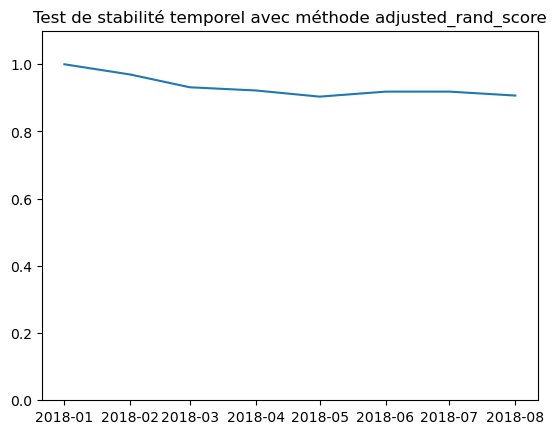

In [94]:
plt.plot(ari.index, ari.ari)
plt.title('Test de stabilité temporel avec méthode adjusted_rand_score')
plt.ylim(0,1.1)
plt.savefig("tsne_kmean_4_stabilite_temp.png", bbox_inches='tight', transparent=True)
plt.show()

In [387]:
#df_all_date. to_csv('df_all_date.csv')

##### [sommaire](#S)

# V, Analyse des groupes <a class='anchor' id='V'></a>

## Groupe 0 <a class='anchor' id='V0'></a>

In [317]:
df = pd.read_csv('df_if2.csv', index_col=0, parse_dates=[1])
tsn = pd.read_csv('tsn_kmean.csv', index_col=0 )
tsn.rename(columns={'0' : 0, '1' : 1}, inplace=True)

In [318]:
from sklearn.cluster import KMeans
km = KMeans(n_clusters=6)
km.fit(tsn)
df['groupe'] = km.labels_

In [319]:
df0 = df[df.groupe == 0]
df1 = df[df.groupe == 1]
df2 = df[df.groupe == 2]
df3 = df[df.groupe == 3]
df4 = df[df.groupe == 4]
df5 = df[df.groupe == 5]
data = df.copy()

In [320]:
df0.describe(include='all', datetime_is_numeric=True)

,date_last_purchase,delivery_time,total_purchase_amount,mean_review_score,total_purchase_count,item_most_purchase,customer_state,payment_type,groupe
count,6169,6169.000000,6169.000000,6169.000000,6169.000000,6169,6169,6169,6169.0
unique,NaN,NaN,NaN,NaN,NaN,62,27,3,NaN
top,NaN,NaN,NaN,NaN,NaN,cama_mesa_banho,SP,credit_card,NaN
freq,NaN,NaN,NaN,NaN,NaN,651,2383,5651,NaN
mean,2017-08-19 04:36:43.970983936,15.290809,90.067766,2.619468,1.086886,NaN,NaN,NaN,0.0
min,2017-01-05 13:43:17,0.000000,4.900000,1.000000,1.000000,NaN,NaN,NaN,0.0
25%,2017-06-02 17:17:56,8.000000,43.990000,1.000000,1.000000,NaN,NaN,NaN,0.0
50%,2017-09-05 19:16:50,12.000000,76.450000,3.000000,1.000000,NaN,NaN,NaN,0.0
75%,2017-11-22 10:24:31,20.000000,120.000000,4.000000,1.000000,NaN,NaN,NaN,0.0
max,2017-12-30 22:07:13,186.000000,379.780000,5.000000,2.000000,NaN,NaN,NaN,0.0


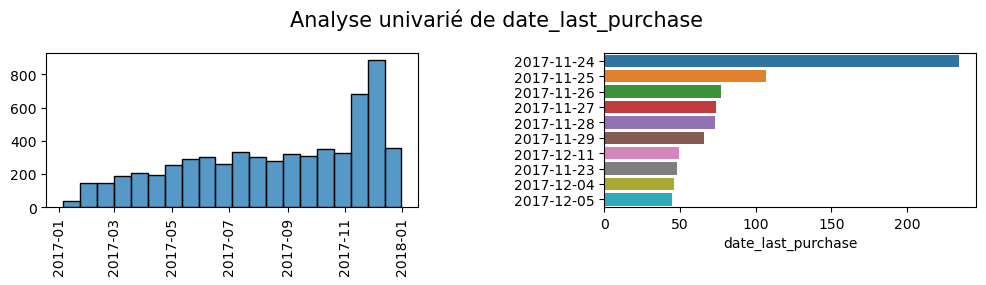

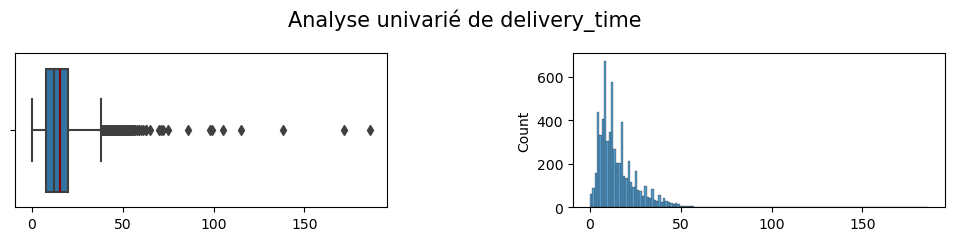

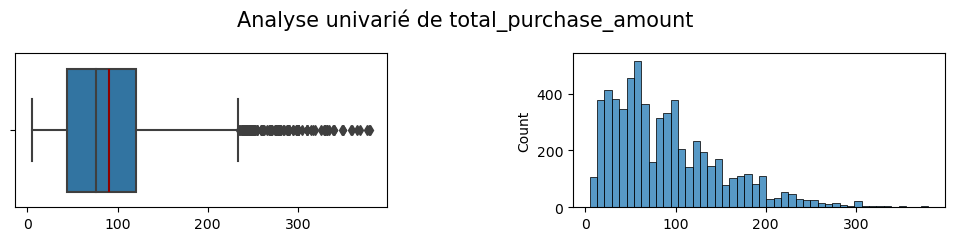

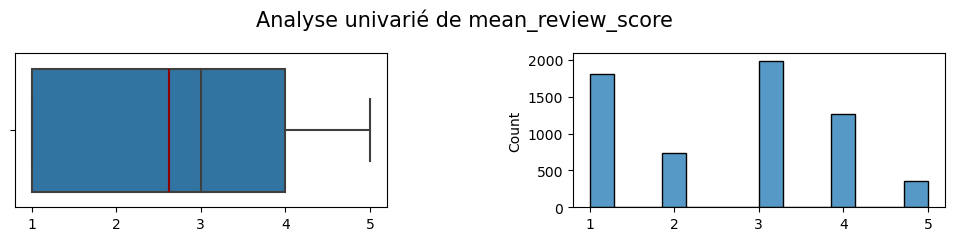

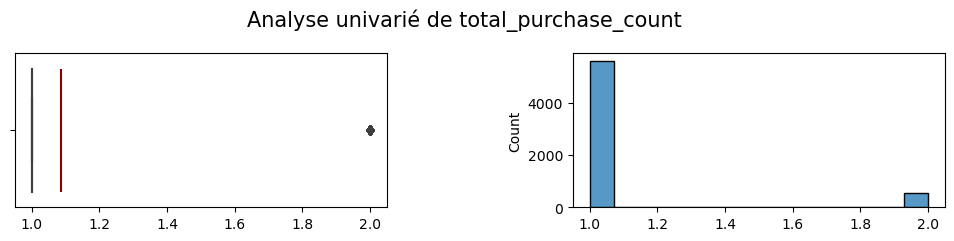

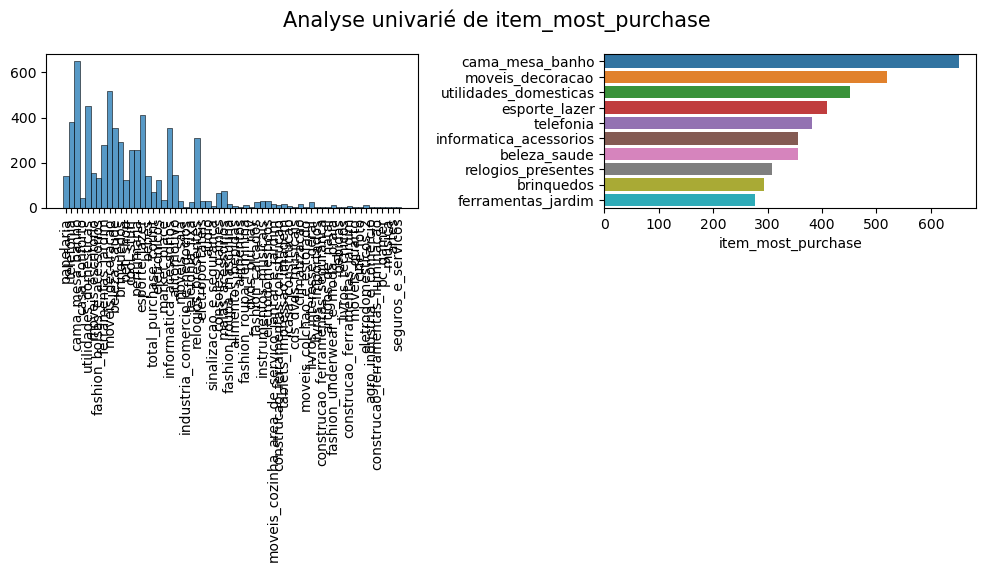

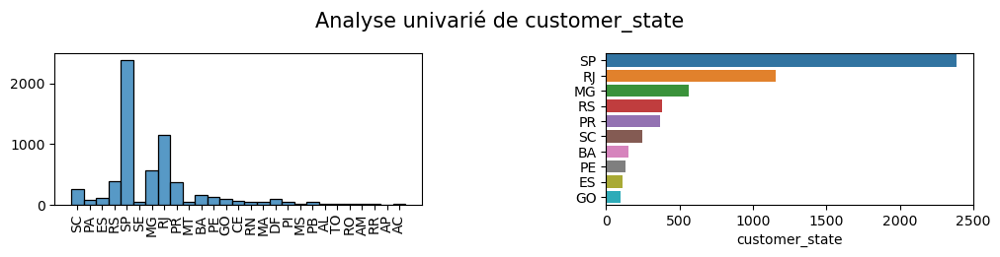

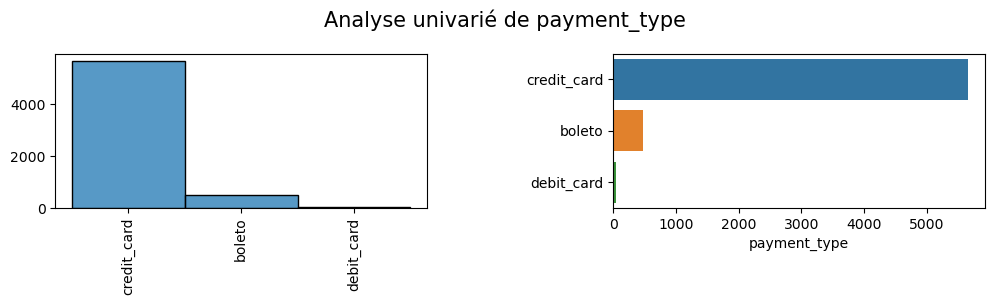

In [321]:
df = df0.copy()
for c in df.columns[:-1]:
    if c == 'customer_unique_id':
        continue
    if (df[c].dtypes == 'float64') | (df[c].dtypes == 'int64'):
        f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,2))
        plt.subplots_adjust(wspace=0.5)
        plt.suptitle('Analyse univarié de {}'.format(c), fontsize=15, y=1.1)
        g1 = sns.boxplot(x=c, data=df, ax=ax[0])
        g1.vlines(df[c].mean(), ymin=-0.4, ymax=0.4, color='darkred')
        g1.set(xlabel=None)
        g2 = sns.histplot(x=c, data=df, ax=ax[1])
        g2.set(xlabel=None)
        plt.savefig("Groupe_0_analyse_univariee_"+c+".png", bbox_inches='tight', transparent=True)
        plt.show()
    else:
        f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,2))
        plt.subplots_adjust(wspace=0.5)
        plt.suptitle('Analyse univarié de {}'.format(c), fontsize=15, y=1.1)
        g1 = sns.histplot(x=c, data=df, ax=ax[0])
        plt.setp(ax[0].xaxis.get_majorticklabels(), rotation=90)
        g1.set(xlabel=None, ylabel=None)
        if ('time' in c) | ('date' in c):
            temp = pd.DataFrame(df[c].dt.date.value_counts())
            temp = temp.iloc[:10,:] 
        else:
            temp = pd.DataFrame(df[c].value_counts())
            temp = temp.iloc[:10,:]
        g2 = sns.barplot(x=c, y=temp.index, data=temp, ax=ax[1])
        plt.savefig("Groupe_0_analyse_univariee_"+c+".png", bbox_inches='tight', transparent=True)
        plt.show()

##### [sommaire](#S)

## Groupe 1 <a class='anchor' id='V1'></a>

In [322]:
df1.describe(include='all', datetime_is_numeric=True)

,date_last_purchase,delivery_time,total_purchase_amount,mean_review_score,total_purchase_count,item_most_purchase,customer_state,payment_type,groupe
count,6563,6563.000000,6563.000000,6563.000000,6563.0,6563,6563,6563,6563.0
unique,NaN,NaN,NaN,NaN,NaN,59,16,2,NaN
top,NaN,NaN,NaN,NaN,NaN,cama_mesa_banho,SP,credit_card,NaN
freq,NaN,NaN,NaN,NaN,NaN,1436,4167,6555,NaN
mean,2017-08-14 23:26:10.392960512,9.379552,129.748487,4.555843,1.0,NaN,NaN,NaN,1.0
min,2017-01-10 14:08:07,0.000000,3.850000,2.000000,1.0,NaN,NaN,NaN,1.0
25%,2017-05-31 21:00:20.500000,6.000000,50.000000,4.000000,1.0,NaN,NaN,NaN,1.0
50%,2017-08-26 10:09:32,9.000000,89.990000,5.000000,1.0,NaN,NaN,NaN,1.0
75%,2017-11-11 20:12:45.500000,12.000000,161.995000,5.000000,1.0,NaN,NaN,NaN,1.0
max,2017-12-30 22:29:45,33.000000,610.000000,5.000000,1.0,NaN,NaN,NaN,1.0


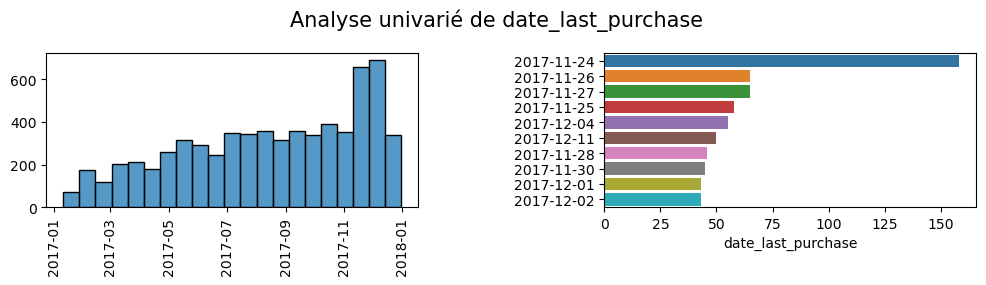

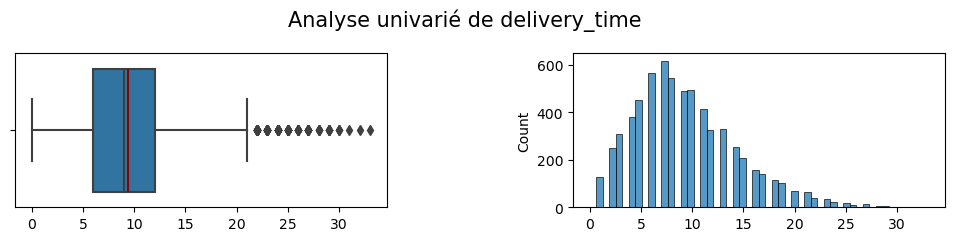

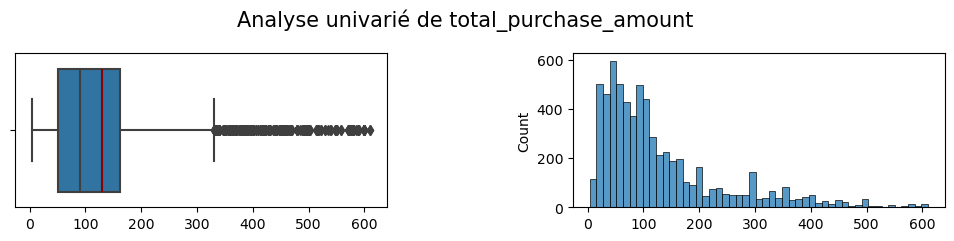

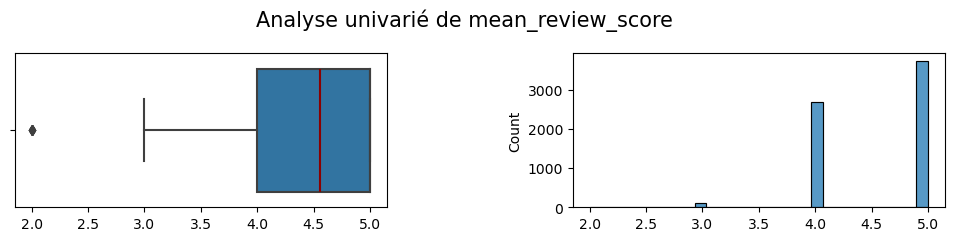

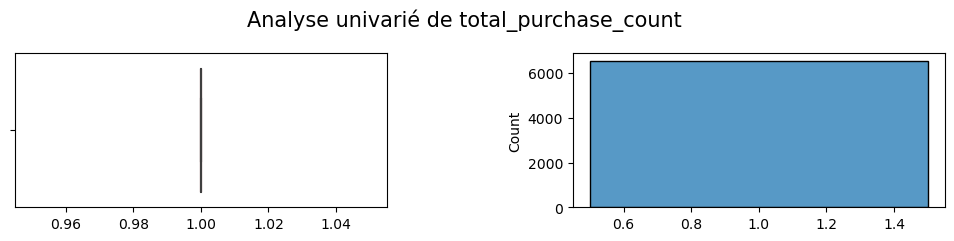

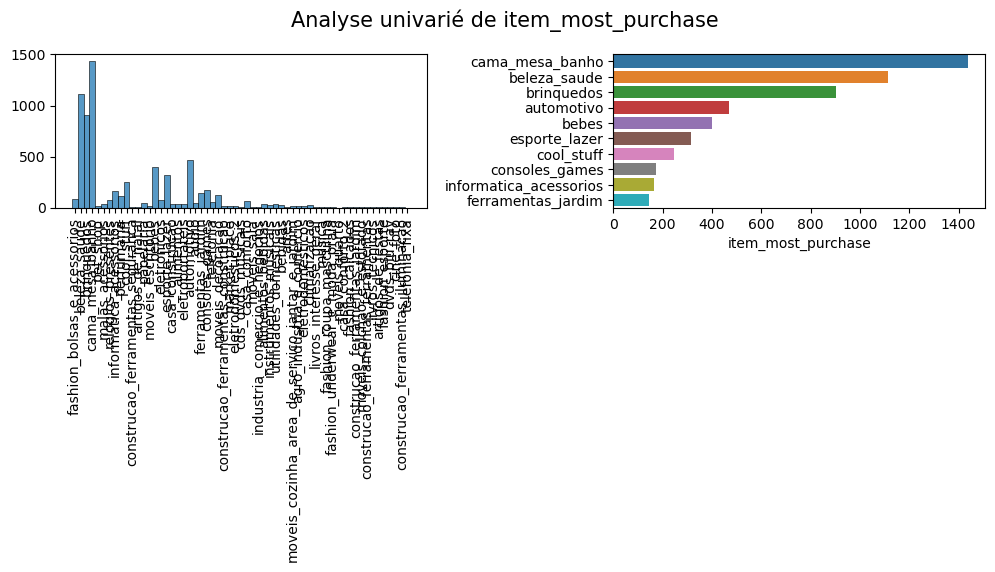

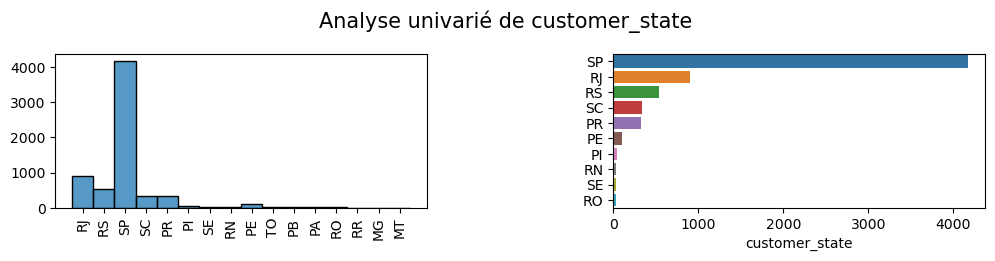

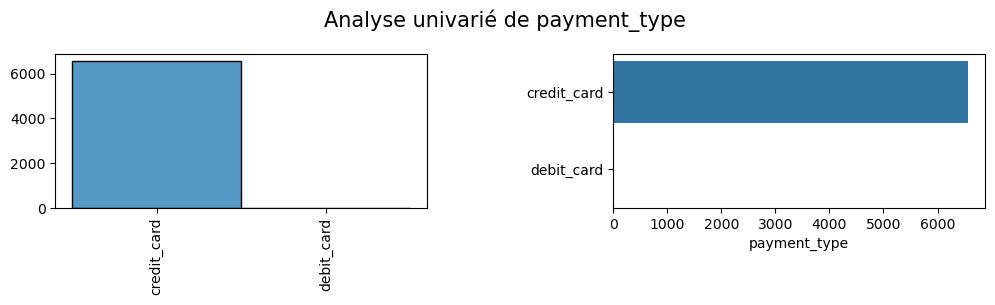

In [323]:
df = df1.copy()
for c in df.columns[:-1]:
    if c == 'customer_unique_id':
        continue
    if (df[c].dtypes == 'float64') | (df[c].dtypes == 'int64'):
        f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,2))
        plt.subplots_adjust(wspace=0.5)
        plt.suptitle('Analyse univarié de {}'.format(c), fontsize=15, y=1.1)
        g1 = sns.boxplot(x=c, data=df, ax=ax[0])
        g1.vlines(df[c].mean(), ymin=-0.4, ymax=0.4, color='darkred')
        g1.set(xlabel=None)
        g2 = sns.histplot(x=c, data=df, ax=ax[1])
        g2.set(xlabel=None)
        plt.savefig("Groupe_1_analyse_univariee_"+c+".png", bbox_inches='tight', transparent=True)
        plt.show()
    else:
        f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,2))
        plt.subplots_adjust(wspace=0.5)
        plt.suptitle('Analyse univarié de {}'.format(c), fontsize=15, y=1.1)
        g1 = sns.histplot(x=c, data=df, ax=ax[0])
        plt.setp(ax[0].xaxis.get_majorticklabels(), rotation=90)
        g1.set(xlabel=None, ylabel=None)
        if ('time' in c) | ('date' in c):
            temp = pd.DataFrame(df[c].dt.date.value_counts())
            temp = temp.iloc[:10,:] 
        else:
            temp = pd.DataFrame(df[c].value_counts())
            temp = temp.iloc[:10,:]
        g2 = sns.barplot(x=c, y=temp.index, data=temp, ax=ax[1])
        plt.savefig("Groupe_1_analyse_univariee_"+c+".png", bbox_inches='tight', transparent=True)
        plt.show()

In [324]:
df11 = df1[df1.mean_review_score < 3.5]

In [325]:
df11.item_most_purchase.value_counts()[:10]

beleza_saude                                      16
esporte_lazer                                      8
moveis_decoracao                                   7
perfumaria                                         6
cool_stuff                                         5
relogios_presentes                                 4
moveis_cozinha_area_de_servico_jantar_e_jardim     4
consoles_games                                     4
informatica_acessorios                             4
ferramentas_jardim                                 4
Name: item_most_purchase, dtype: int64

In [326]:
df11.total_purchase_amount.describe()

count    104.000000
mean     343.243462
std       68.495131
min      192.000000
25%      299.900000
50%      339.990000
75%      389.900000
max      579.000000
Name: total_purchase_amount, dtype: float64

In [327]:
df11.delivery_time.describe()

count    104.000000
mean      12.173077
std        6.039421
min        1.000000
25%        7.000000
50%       11.000000
75%       16.000000
max       27.000000
Name: delivery_time, dtype: float64

In [328]:
df1.total_purchase_amount.describe()

count    6563.000000
mean      129.748487
std       112.682281
min         3.850000
25%        50.000000
50%        89.990000
75%       161.995000
max       610.000000
Name: total_purchase_amount, dtype: float64

In [329]:
df1.delivery_time.describe()

count    6563.000000
mean        9.379552
std         5.103165
min         0.000000
25%         6.000000
50%         9.000000
75%        12.000000
max        33.000000
Name: delivery_time, dtype: float64

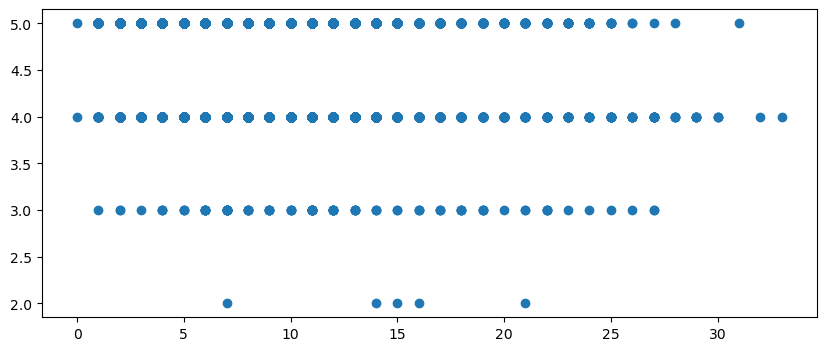

In [331]:
plt.figure(figsize=(10,4))
plt.scatter(df1.delivery_time, df1.mean_review_score)
#plt.savefig("bivarie_review_delivery_time.png", bbox_inches='tight', transparent=True)
plt.show()

##### [sommaire](#S)

## Groupe 2 <a class='anchor' id='V2'></a>

In [332]:
df2.describe(include='all', datetime_is_numeric=True)

,date_last_purchase,delivery_time,total_purchase_amount,mean_review_score,total_purchase_count,item_most_purchase,customer_state,payment_type,groupe
count,5710,5710.000000,5710.000000,5710.000000,5710.000000,5710,5710,5710,5710.0
unique,NaN,NaN,NaN,NaN,NaN,63,27,4,NaN
top,NaN,NaN,NaN,NaN,NaN,cama_mesa_banho,SP,credit_card,NaN
freq,NaN,NaN,NaN,NaN,NaN,558,1716,2446,NaN
mean,2017-08-16 01:05:34.638879232,12.147110,99.815935,3.975131,1.416462,NaN,NaN,NaN,2.0
min,2017-01-05 19:52:28,0.000000,3.900000,1.000000,1.000000,NaN,NaN,NaN,2.0
25%,2017-05-31 16:55:25.500000,7.500000,44.990000,3.000000,1.000000,NaN,NaN,NaN,2.0
50%,2017-08-30 11:24:37,11.000000,79.800000,5.000000,1.000000,NaN,NaN,NaN,2.0
75%,2017-11-12 11:50:26.249999872,15.000000,129.990000,5.000000,2.000000,NaN,NaN,NaN,2.0
max,2017-12-30 21:44:05,43.000000,459.800000,5.000000,2.000000,NaN,NaN,NaN,2.0


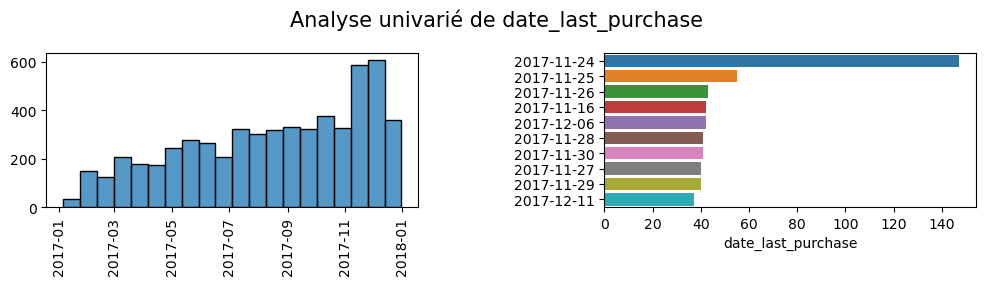

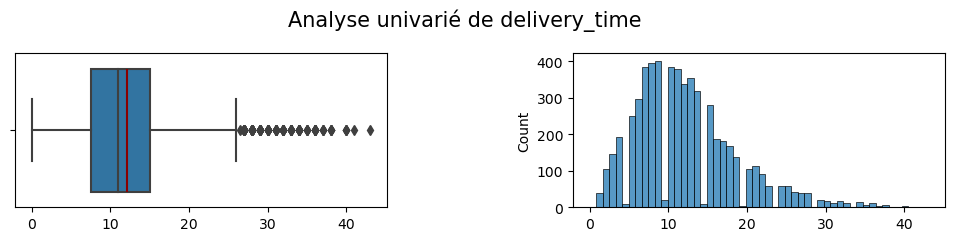

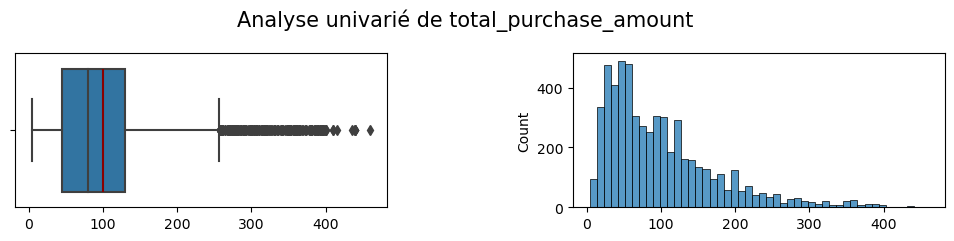

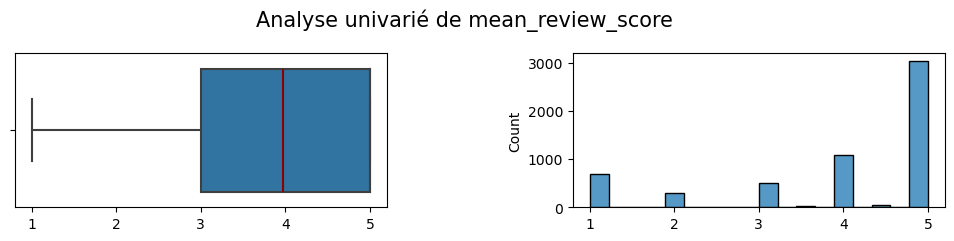

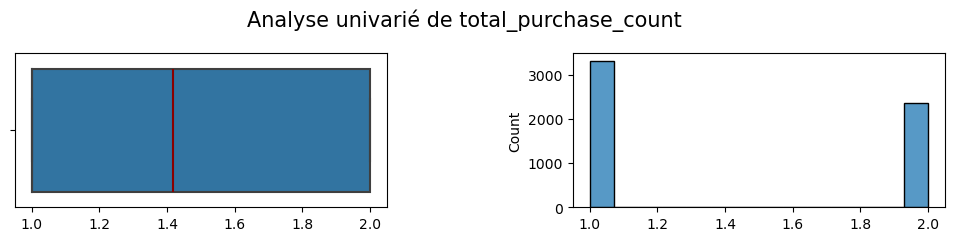

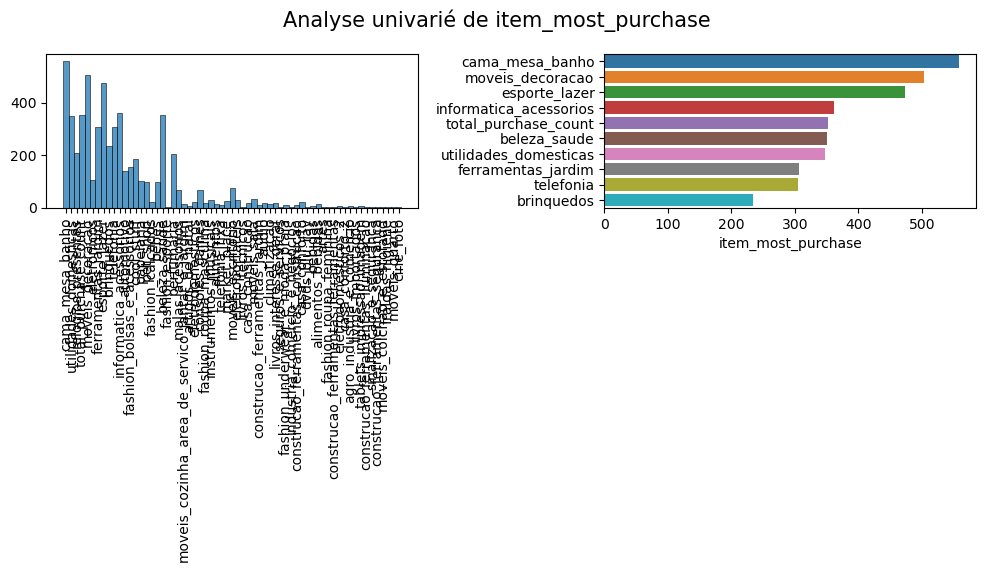

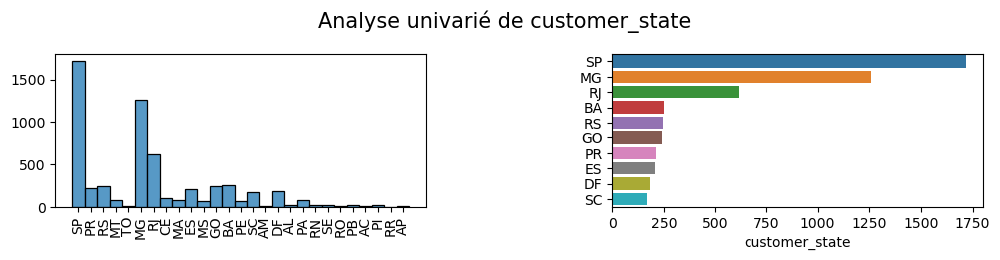

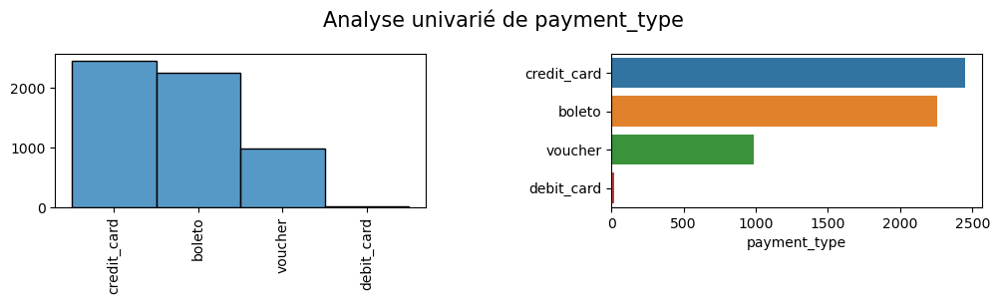

In [333]:
df = df2.copy()
for c in df.columns[:-1]:
    if c == 'customer_unique_id':
        continue
    if (df[c].dtypes == 'float64') | (df[c].dtypes == 'int64'):
        f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,2))
        plt.subplots_adjust(wspace=0.5)
        plt.suptitle('Analyse univarié de {}'.format(c), fontsize=15, y=1.1)
        g1 = sns.boxplot(x=c, data=df, ax=ax[0])
        g1.vlines(df[c].mean(), ymin=-0.4, ymax=0.4, color='darkred')
        g1.set(xlabel=None)
        g2 = sns.histplot(x=c, data=df, ax=ax[1])
        g2.set(xlabel=None)
        plt.savefig("Groupe_2_analyse_univariee_"+c+".png", bbox_inches='tight', transparent=True)
        plt.show()
    else:
        f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,2))
        plt.subplots_adjust(wspace=0.5)
        plt.suptitle('Analyse univarié de {}'.format(c), fontsize=15, y=1.1)
        g1 = sns.histplot(x=c, data=df, ax=ax[0])
        plt.setp(ax[0].xaxis.get_majorticklabels(), rotation=90)
        g1.set(xlabel=None, ylabel=None)
        if ('time' in c) | ('date' in c):
            temp = pd.DataFrame(df[c].dt.date.value_counts())
            temp = temp.iloc[:10,:] 
        else:
            temp = pd.DataFrame(df[c].value_counts())
            temp = temp.iloc[:10,:]
        g2 = sns.barplot(x=c, y=temp.index, data=temp, ax=ax[1])
        plt.savefig("Groupe_2_analyse_univariee_"+c+".png", bbox_inches='tight', transparent=True)
        plt.show()

##### [sommaire](#S)

## Groupe 3 <a class='anchor' id='V3'></a>

In [334]:
df3.describe(include='all', datetime_is_numeric=True)

,date_last_purchase,delivery_time,total_purchase_amount,mean_review_score,total_purchase_count,item_most_purchase,customer_state,payment_type,groupe
count,5640,5640.000000,5640.000000,5640.000000,5640.0,5640,5640,5640,5640.0
unique,NaN,NaN,NaN,NaN,NaN,67,27,2,NaN
top,NaN,NaN,NaN,NaN,NaN,esporte_lazer,SP,boleto,NaN
freq,NaN,NaN,NaN,NaN,NaN,503,2576,4897,NaN
mean,2017-08-25 00:17:29.863829760,11.519858,87.536787,4.630674,1.0,NaN,NaN,NaN,3.0
min,2017-01-05 12:14:58,1.000000,3.900000,2.000000,1.0,NaN,NaN,NaN,3.0
25%,2017-06-13 06:28:08,7.000000,35.090000,4.000000,1.0,NaN,NaN,NaN,3.0
50%,2017-09-13 19:55:58.500000,11.000000,63.695000,5.000000,1.0,NaN,NaN,NaN,3.0
75%,2017-11-19 17:16:40.500000,14.000000,112.992500,5.000000,1.0,NaN,NaN,NaN,3.0
max,2017-12-30 18:04:46,48.000000,495.000000,5.000000,1.0,NaN,NaN,NaN,3.0


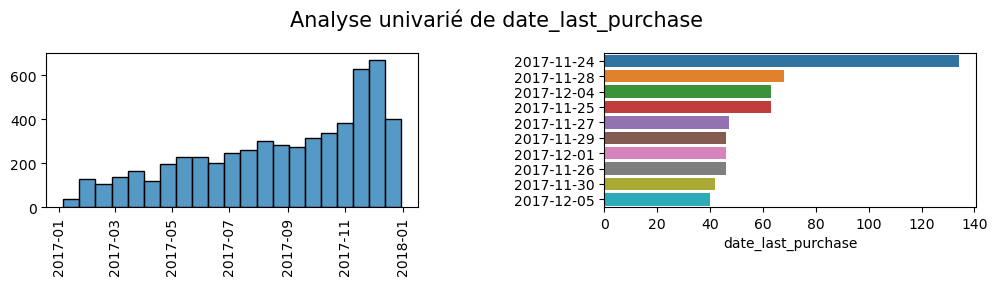

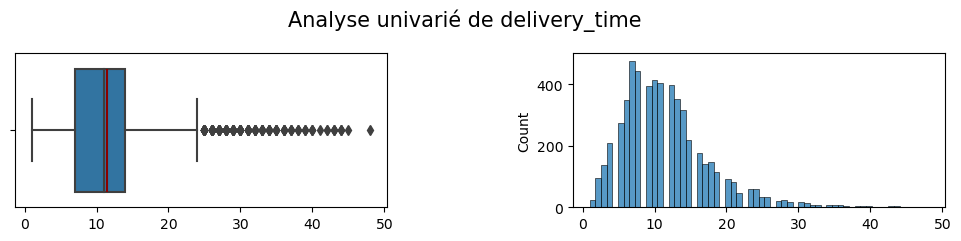

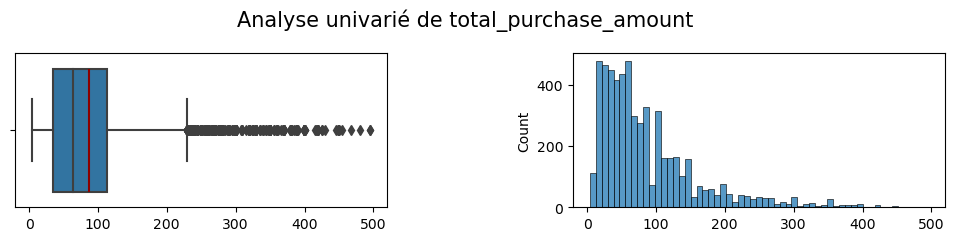

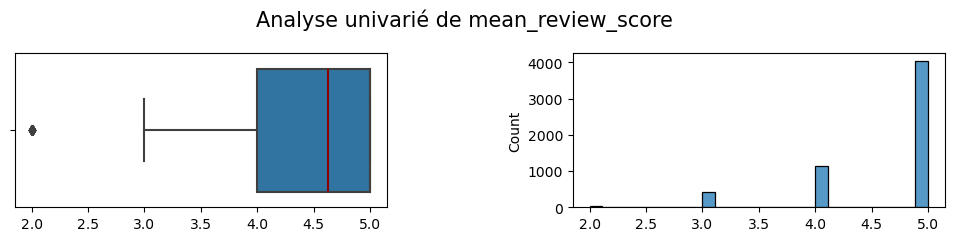

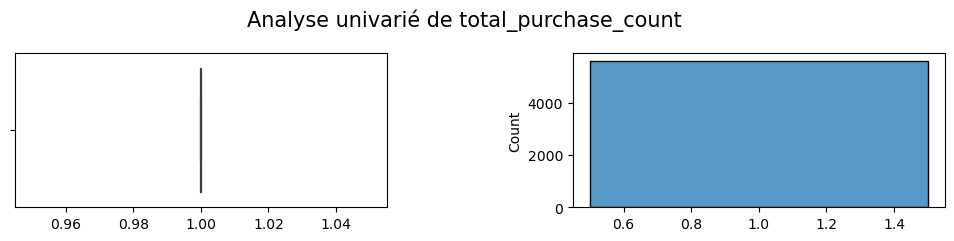

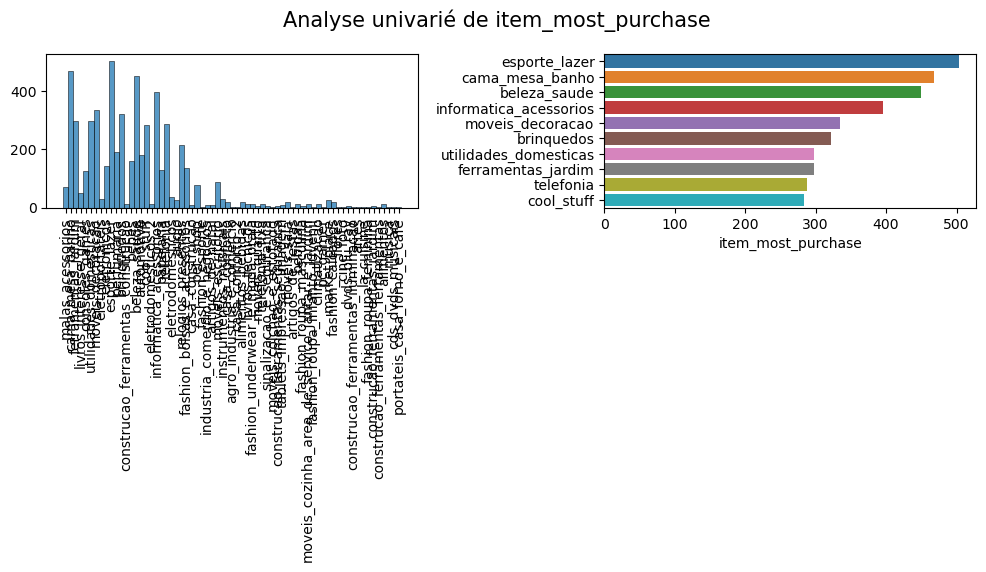

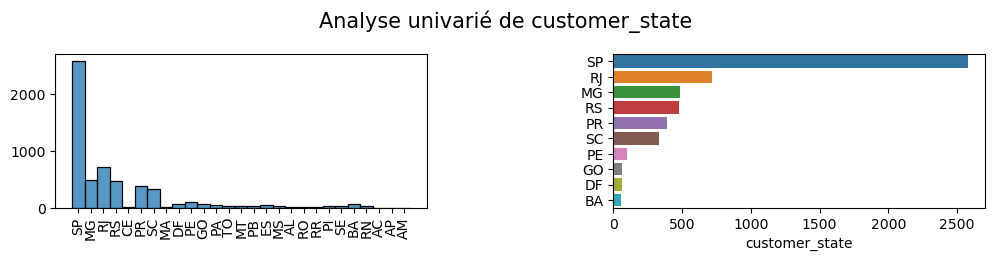

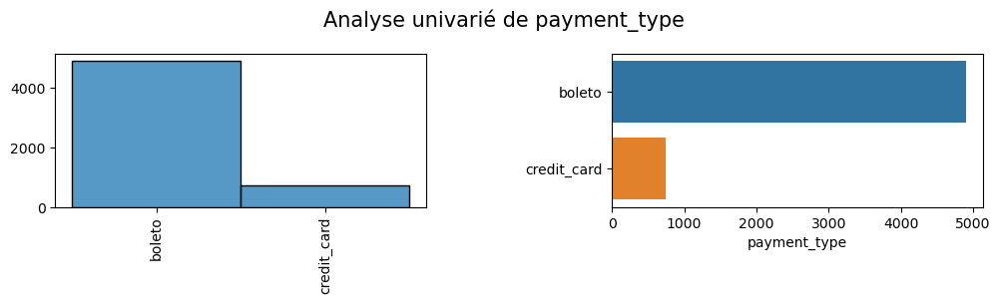

In [335]:
df = df3.copy()
for c in df.columns[:-1]:
    if c == 'customer_unique_id':
        continue
    if (df[c].dtypes == 'float64') | (df[c].dtypes == 'int64'):
        f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,2))
        plt.subplots_adjust(wspace=0.5)
        plt.suptitle('Analyse univarié de {}'.format(c), fontsize=15, y=1.1)
        g1 = sns.boxplot(x=c, data=df, ax=ax[0])
        g1.vlines(df[c].mean(), ymin=-0.4, ymax=0.4, color='darkred')
        g1.set(xlabel=None)
        g2 = sns.histplot(x=c, data=df, ax=ax[1])
        g2.set(xlabel=None)
        plt.savefig("Groupe_3_analyse_univariee_"+c+".png", bbox_inches='tight', transparent=True)
        plt.show()
    else:
        f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,2))
        plt.subplots_adjust(wspace=0.5)
        plt.suptitle('Analyse univarié de {}'.format(c), fontsize=15, y=1.1)
        g1 = sns.histplot(x=c, data=df, ax=ax[0])
        plt.setp(ax[0].xaxis.get_majorticklabels(), rotation=90)
        g1.set(xlabel=None, ylabel=None)
        if ('time' in c) | ('date' in c):
            temp = pd.DataFrame(df[c].dt.date.value_counts())
            temp = temp.iloc[:10,:] 
        else:
            temp = pd.DataFrame(df[c].value_counts())
            temp = temp.iloc[:10,:]
        g2 = sns.barplot(x=c, y=temp.index, data=temp, ax=ax[1])
        plt.savefig("Groupe_3_analyse_univariee_"+c+".png", bbox_inches='tight', transparent=True)
        plt.show()

##### [sommaire](#S)

## Groupe 4 <a class='anchor' id='V4'></a>

In [336]:
df4.describe(include='all', datetime_is_numeric=True)

,date_last_purchase,delivery_time,total_purchase_amount,mean_review_score,total_purchase_count,item_most_purchase,customer_state,payment_type,groupe
count,6978,6978.000000,6978.000000,6978.000000,6978.0,6978,6978,6978,6978.0
unique,NaN,NaN,NaN,NaN,NaN,62,14,1,NaN
top,NaN,NaN,NaN,NaN,NaN,esporte_lazer,SP,credit_card,NaN
freq,NaN,NaN,NaN,NaN,NaN,919,3907,6978,NaN
mean,2017-08-14 18:22:27.498853632,8.941674,85.750992,4.999857,1.0,NaN,NaN,NaN,4.0
min,2017-01-05 11:56:06,0.000000,2.290000,4.000000,1.0,NaN,NaN,NaN,4.0
25%,2017-06-04 11:01:30.249999872,5.000000,39.900000,5.000000,1.0,NaN,NaN,NaN,4.0
50%,2017-08-26 19:03:17,8.000000,69.000000,5.000000,1.0,NaN,NaN,NaN,4.0
75%,2017-11-07 08:07:36.750000128,12.000000,119.900000,5.000000,1.0,NaN,NaN,NaN,4.0
max,2017-12-30 23:53:28,30.000000,319.120000,5.000000,1.0,NaN,NaN,NaN,4.0


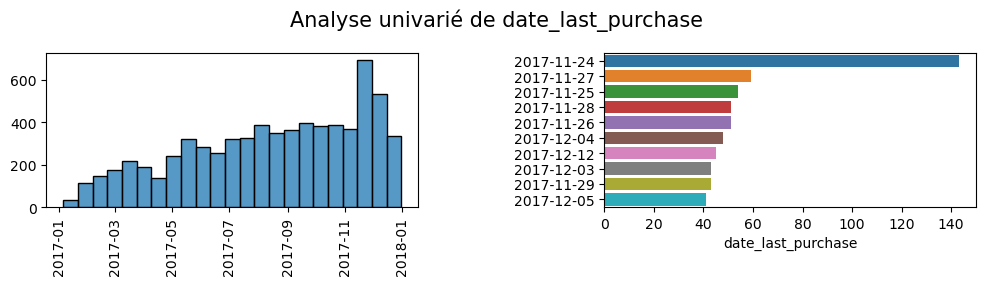

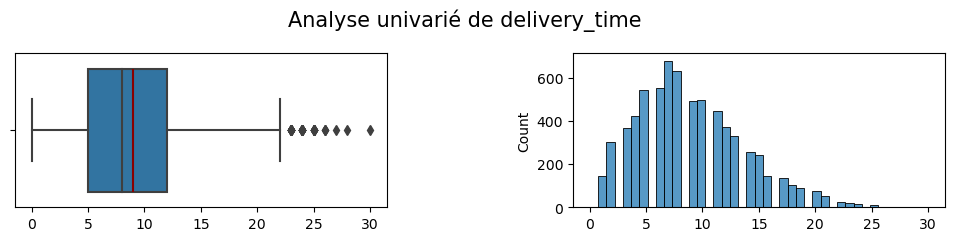

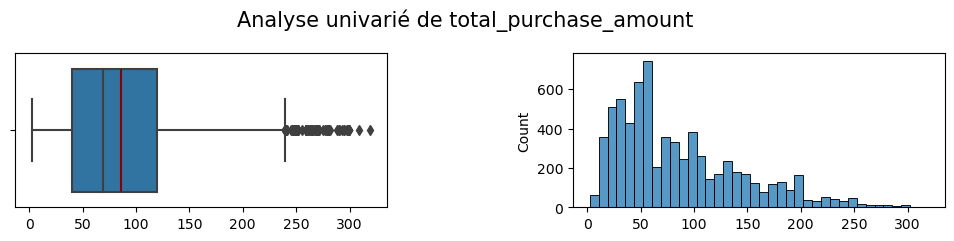

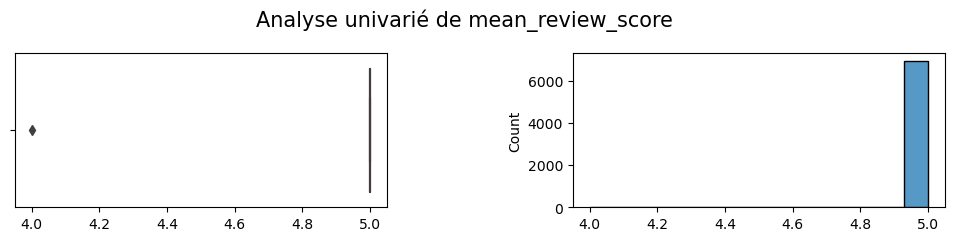

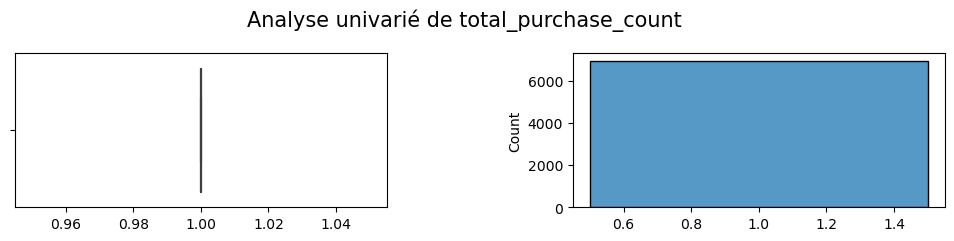

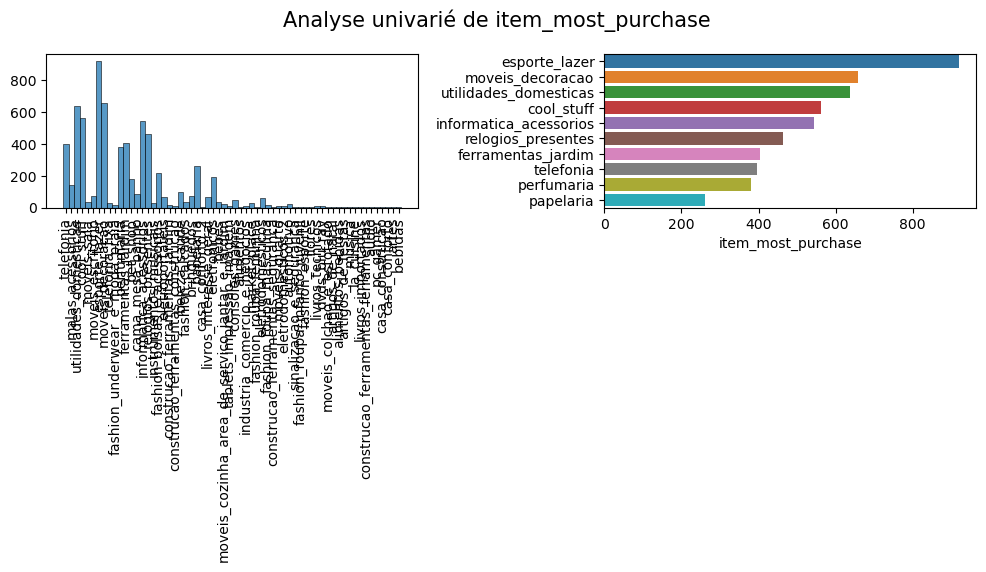

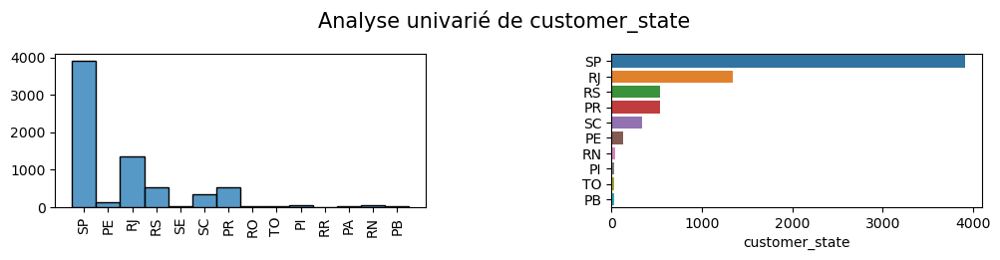

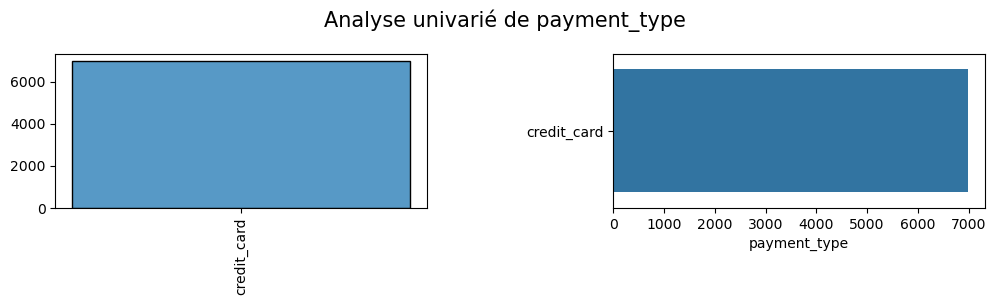

In [337]:
df = df4.copy()
for c in df.columns[:-1]:
    if c == 'customer_unique_id':
        continue
    if (df[c].dtypes == 'float64') | (df[c].dtypes == 'int64'):
        f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,2))
        plt.subplots_adjust(wspace=0.5)
        plt.suptitle('Analyse univarié de {}'.format(c), fontsize=15, y=1.1)
        g1 = sns.boxplot(x=c, data=df, ax=ax[0])
        g1.vlines(df[c].mean(), ymin=-0.4, ymax=0.4, color='darkred')
        g1.set(xlabel=None)
        g2 = sns.histplot(x=c, data=df, ax=ax[1])
        g2.set(xlabel=None)
        plt.savefig("Groupe_4_analyse_univariee_"+c+".png", bbox_inches='tight', transparent=True)
        plt.show()
    else:
        f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,2))
        plt.subplots_adjust(wspace=0.5)
        plt.suptitle('Analyse univarié de {}'.format(c), fontsize=15, y=1.1)
        g1 = sns.histplot(x=c, data=df, ax=ax[0])
        plt.setp(ax[0].xaxis.get_majorticklabels(), rotation=90)
        g1.set(xlabel=None, ylabel=None)
        if ('time' in c) | ('date' in c):
            temp = pd.DataFrame(df[c].dt.date.value_counts())
            temp = temp.iloc[:10,:] 
        else:
            temp = pd.DataFrame(df[c].value_counts())
            temp = temp.iloc[:10,:]
        g2 = sns.barplot(x=c, y=temp.index, data=temp, ax=ax[1])
        plt.savefig("Groupe_4_analyse_univariee_"+c+".png", bbox_inches='tight', transparent=True)
        plt.show()

In [338]:
df4.total_purchase_amount.mean()

85.75099168816594

In [339]:
df44 = df4[df4.total_purchase_amount > 200]

In [340]:
df44.item_most_purchase.value_counts()

relogios_presentes                                64
cool_stuff                                        48
esporte_lazer                                     46
perfumaria                                        33
informatica_acessorios                            29
utilidades_domesticas                             17
ferramentas_jardim                                17
moveis_decoracao                                  12
telefonia                                         10
malas_acessorios                                   6
pet_shop                                           5
moveis_cozinha_area_de_servico_jantar_e_jardim     4
papelaria                                          4
eletroportateis                                    4
moveis_escritorio                                  4
eletronicos                                        4
moveis_quarto                                      3
eletrodomesticos_2                                 2
instrumentos_musicais                         

##### [sommaire](#S)

## Groupe 5 <a class='anchor' id='V5'></a>

In [341]:
df5.describe(include='all', datetime_is_numeric=True)

,date_last_purchase,delivery_time,total_purchase_amount,mean_review_score,total_purchase_count,item_most_purchase,customer_state,payment_type,groupe
count,6158,6158.000000,6158.000000,6158.000000,6158.0,6158,6158,6158,6158.0
unique,NaN,NaN,NaN,NaN,NaN,65,26,2,NaN
top,NaN,NaN,NaN,NaN,NaN,cama_mesa_banho,MG,credit_card,NaN
freq,NaN,NaN,NaN,NaN,NaN,532,2226,5867,NaN
mean,2017-08-09 01:39:21.348002560,14.362131,126.281556,4.678792,1.0,NaN,NaN,NaN,5.0
min,2017-01-05 22:52:33,1.000000,5.200000,2.000000,1.0,NaN,NaN,NaN,5.0
25%,2017-05-25 15:50:26.500000,9.000000,51.900000,4.000000,1.0,NaN,NaN,NaN,5.0
50%,2017-08-17 14:04:43,13.000000,99.000000,5.000000,1.0,NaN,NaN,NaN,5.0
75%,2017-11-03 18:45:32.750000128,19.000000,174.000000,5.000000,1.0,NaN,NaN,NaN,5.0
max,2017-12-30 21:48:24,51.000000,539.900000,5.000000,1.0,NaN,NaN,NaN,5.0


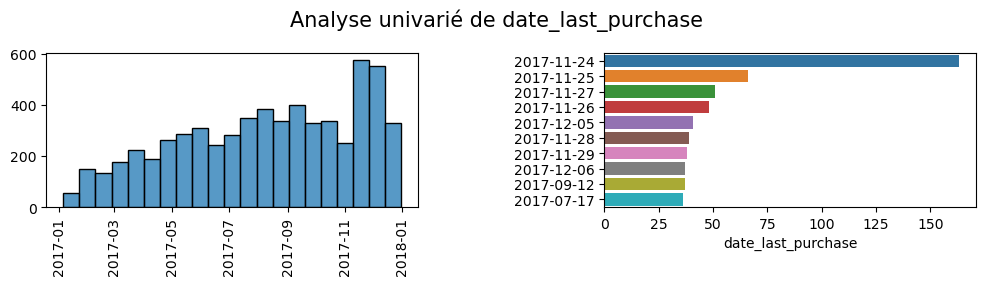

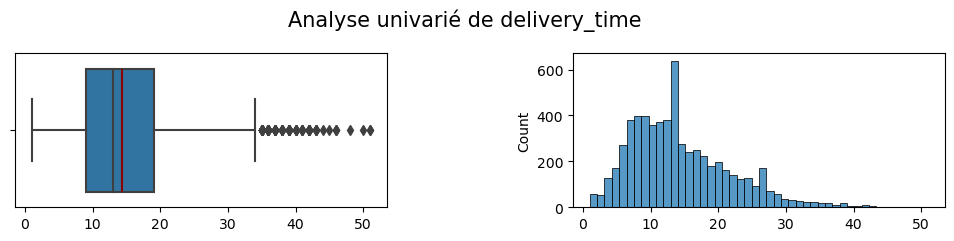

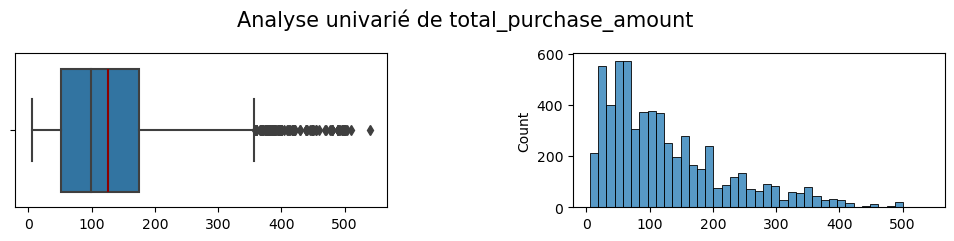

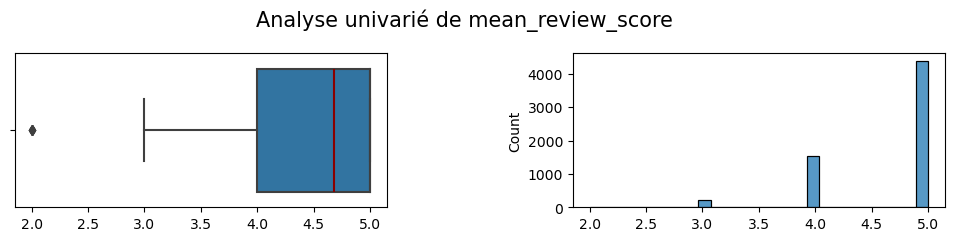

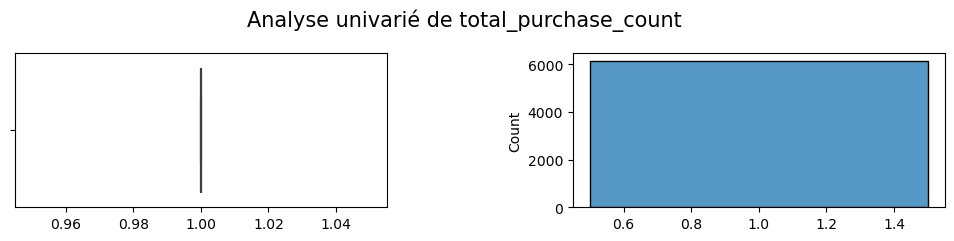

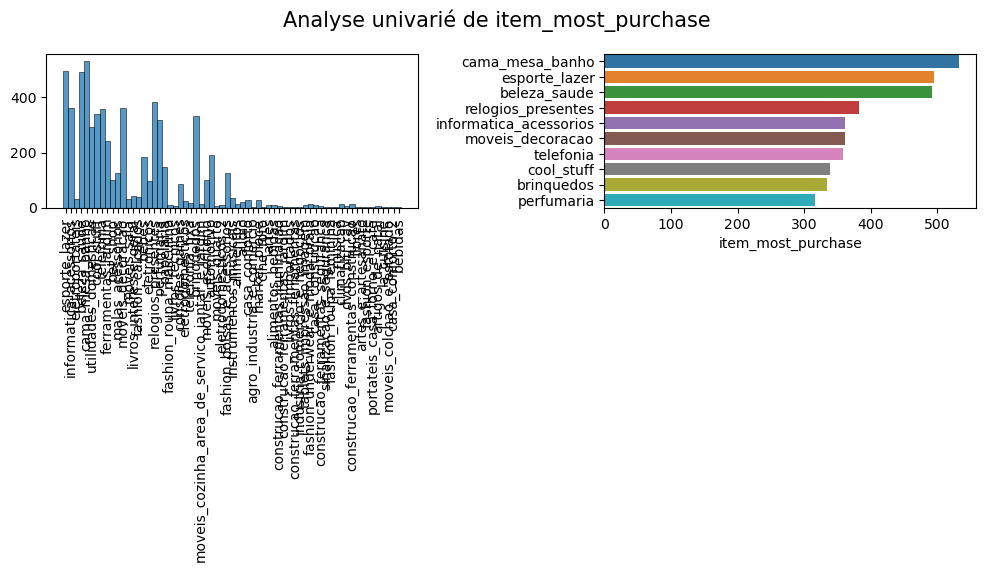

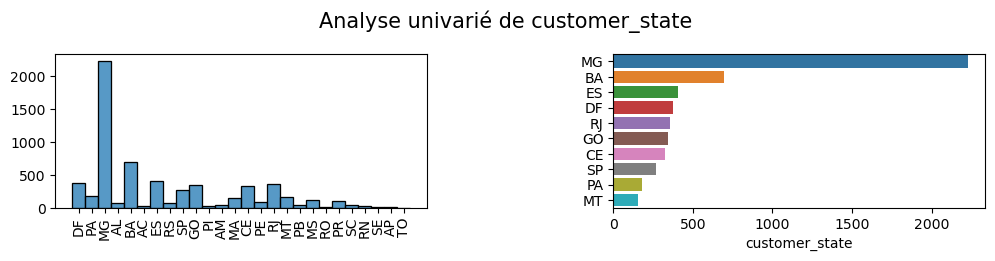

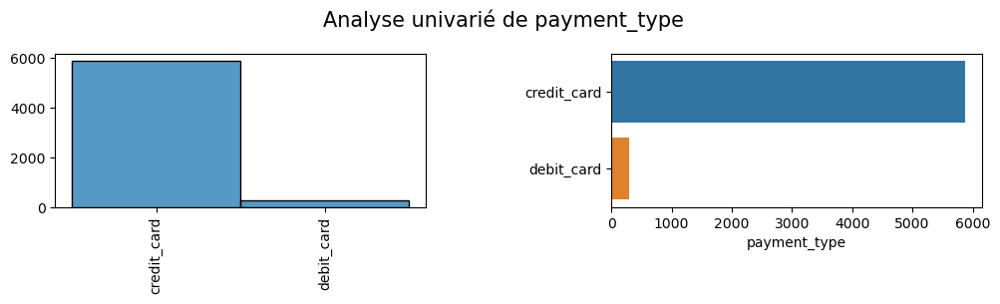

In [342]:
df = df5.copy()
for c in df.columns[:-1]:
    if c == 'customer_unique_id':
        continue
    if (df[c].dtypes == 'float64') | (df[c].dtypes == 'int64'):
        f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,2))
        plt.subplots_adjust(wspace=0.5)
        plt.suptitle('Analyse univarié de {}'.format(c), fontsize=15, y=1.1)
        g1 = sns.boxplot(x=c, data=df, ax=ax[0])
        g1.vlines(df[c].mean(), ymin=-0.4, ymax=0.4, color='darkred')
        g1.set(xlabel=None)
        g2 = sns.histplot(x=c, data=df, ax=ax[1])
        g2.set(xlabel=None)
        plt.savefig("Groupe_5_analyse_univariee_"+c+".png", bbox_inches='tight', transparent=True)
        plt.show()
    else:
        f, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,2))
        plt.subplots_adjust(wspace=0.5)
        plt.suptitle('Analyse univarié de {}'.format(c), fontsize=15, y=1.1)
        g1 = sns.histplot(x=c, data=df, ax=ax[0])
        plt.setp(ax[0].xaxis.get_majorticklabels(), rotation=90)
        g1.set(xlabel=None, ylabel=None)
        if ('time' in c) | ('date' in c):
            temp = pd.DataFrame(df[c].dt.date.value_counts())
            temp = temp.iloc[:10,:] 
        else:
            temp = pd.DataFrame(df[c].value_counts())
            temp = temp.iloc[:10,:]
        g2 = sns.barplot(x=c, y=temp.index, data=temp, ax=ax[1])
        plt.savefig("Groupe_5_analyse_univariee_"+c+".png", bbox_inches='tight', transparent=True)
        plt.show()

In [343]:
df5.total_purchase_amount.mean()

126.28155569990636

In [344]:
df4.total_purchase_amount.mean()

85.75099168816594

##### [sommaire](#S)

## Représentation radiale <a class='anchor' id='R'></a>

In [345]:
mean_amount = []
max_amount = []
mean_review = []
count = []


for i in [0,1,2,3,4,5]:
    temp = data[data.groupe == i]
    mean_amount.append(temp.total_purchase_amount.mean())
    max_amount.append(temp.total_purchase_amount.max())
    mean_review.append(temp.mean_review_score.mean())
    count.append(temp.total_purchase_count.mean())

df_polar = pd.DataFrame([mean_amount, max_amount, mean_review, count], 
                        index=['mean_amount', 'max_amount', 'mean_review', 'count']).T

In [346]:
from sklearn.preprocessing import StandardScaler

In [347]:
norm = StandardScaler()
values = norm.fit_transform(df_polar.values)
df_polar = pd.DataFrame(values, index=df_polar.index, columns=df_polar.columns)

In [348]:
df_polar

,mean_amount,max_amount,mean_review,count
0,-0.724515,-0.904970,-2.062672,0.019692
1,1.464656,1.476447,0.397017,-0.551640
2,-0.186712,-0.077236,-0.340635,2.186867
3,-0.864148,0.286876,0.492071,-0.551640
4,-0.962670,-1.532443,0.961027,-0.551640
5,1.273387,0.751326,0.553193,-0.551640


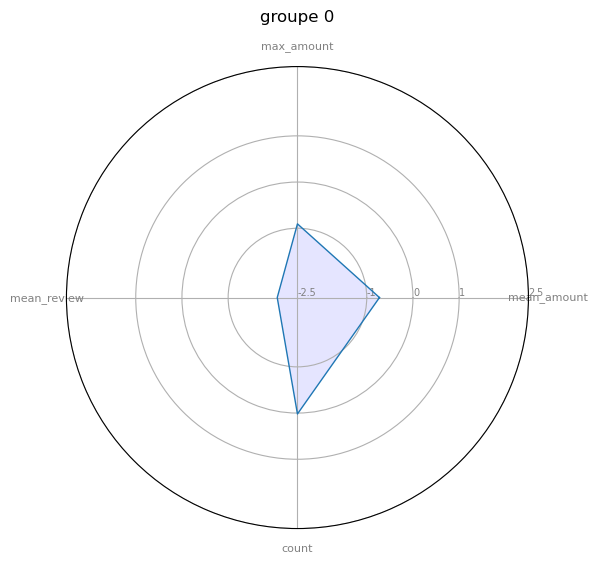

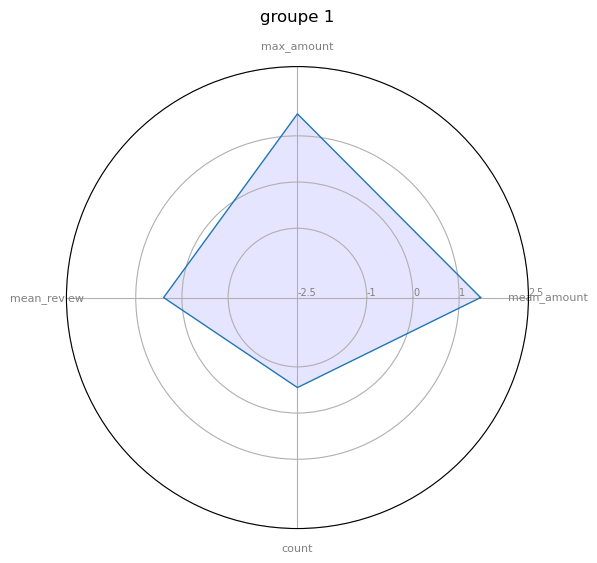

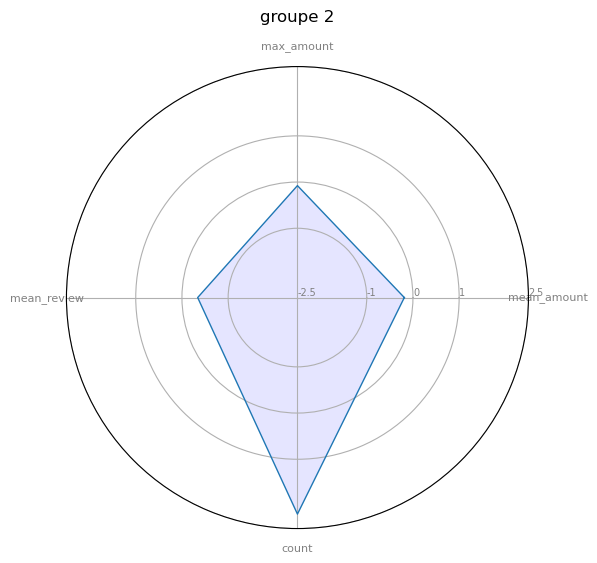

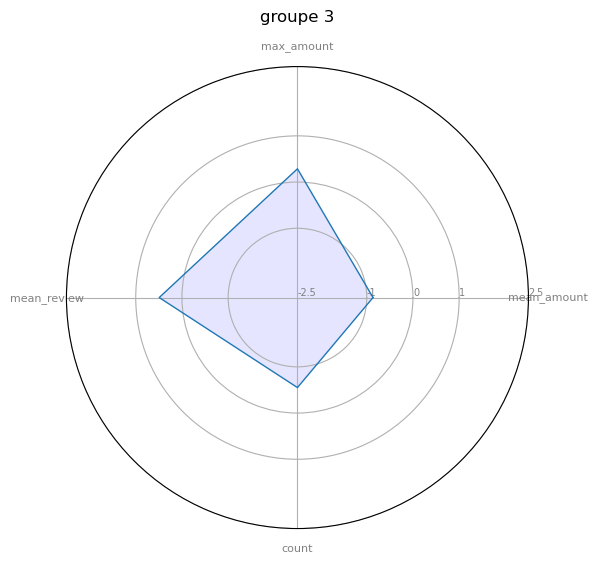

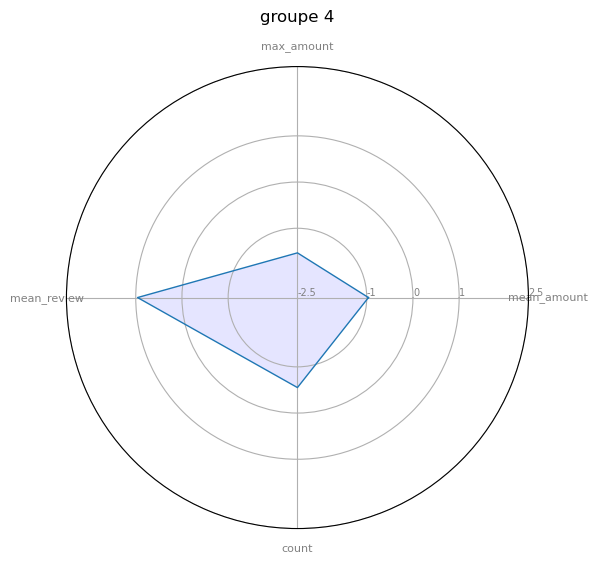

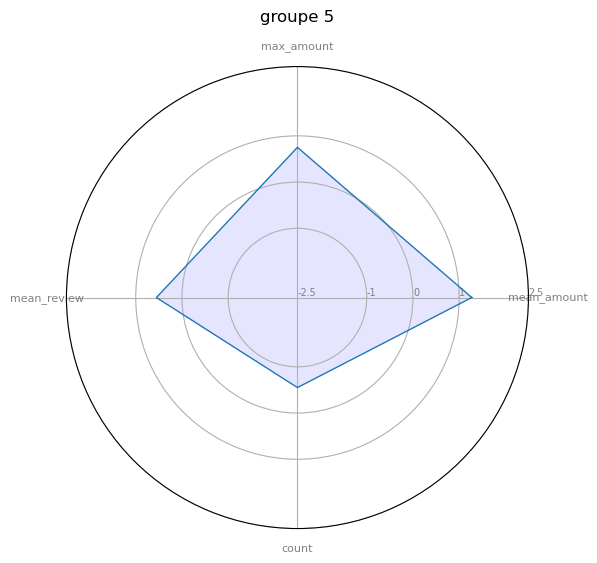

In [349]:
# Libraries
import matplotlib.pyplot as plt
import pandas as pd
from math import pi
 
# Set data
df7=df_polar
#df = pd.DataFrame({
#'group': ['A','B','C','D'],
#'var1': [38, 1.5, 30, 4],
#'var2': [29, 10, 9, 34],
#'var3': [8, 39, 23, 24],
#'var4': [7, 31, 33, 14],
#'var5': [28, 15, 32, 14]
#})



# number of variable
categories=list(df7)
N = len(categories)

for i in range(0,len(df_polar)):
    
    plt.figure(figsize=(6,6))
    # We are going to plot the first line of the data frame.
    # But we need to repeat the first value to close the circular graph:
    values=df7.iloc[i].values.flatten().tolist()
    values += values[:1]
    values
 
    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
 
    # Initialise the spider plot
    ax = plt.subplot(111, polar=True)
 
    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey', size=8)
 
    # Draw ylabels
    ax.set_rlabel_position(0)
    plt.yticks([-2.5,-1,0,1,2.5], ["-2.5","-1","0","1","2.5"], color="grey", size=7)
    plt.ylim(-2.5,2.5)
 
    # Plot data
    ax.plot(angles, values, linewidth=1, linestyle='solid')
 
    # Fill area
    ax.fill(angles, values, 'b', alpha=0.1)

    # Title
    plt.title('groupe '+str(df7.index[i]), pad=15)
    plt.savefig("polar" + str(i) + ".png", bbox_inches='tight', transparent=True)

plt.show(block=False)


##### [sommaire](#S)

##### fin de page <a class='anchor' id='fdp'></a>